# Estimating Soil Moisture in Catalonia with Deep Learning

# TABLE OF CONTENTS

>[TABLE OF CONTENTS](#scrollTo=EoF0ApRmHRh7)

>[PROBLEM STATEMENT AND MOTIVATION](#scrollTo=08b03c20-56fd-4f31-9c84-6e12b9483a5e)

>[ETL PIPELINE](#scrollTo=UryN_TnuzTn7)

>>[Imports and authentication](#scrollTo=fc808844-72bc-41a6-b255-5fa93847be59)

>>[ETL](#scrollTo=XeQPGD-7zk6M)

>>>[Extracting Google Tiff Files](#scrollTo=CewclPw_zx1S)

>>>[Transform and Store into Google S bucket](#scrollTo=M_hEfx2Fz2jk)

>>>[Downloading images from Google Cloud Platform Bucket onto local machine](#scrollTo=7c535c08-7c2a-4696-8963-56f5e0912fc3)

>[EDA](#scrollTo=K4pUnB8t0ZbB)

>>[Exploring and Visualizing Satelite Images](#scrollTo=9Xbhf_w-0mMd)

>>>[One Day Snap Shots of the Spain/Portugal Region](#scrollTo=678a33b2-7969-470e-8479-8f209297db7d)

>>>[Full Dataset of Catalonia Region in Spain](#scrollTo=adbd04ad-0055-438d-a090-0e5687a0ea27)

>>[Trend Analysis](#scrollTo=f4524497-a7ba-4b88-af66-8653e778ce9d)

>>>[Summary of Time Series](#scrollTo=ckgxncLz5_yb)

>>>[Time Series Analysis](#scrollTo=c2530b84-997d-481b-b5e3-f7a974085876)

>>>>[Annually](#scrollTo=ed74fd32-b2ed-4fe4-a2ad-f51a9c1f3d4c)

>>>>[Quarterly](#scrollTo=fc7cbb00-0584-4088-a955-904f04de9b3c)

>>>>[Monthly](#scrollTo=c97ebd21-49aa-4a25-bda5-068485a969a9)

>>>>[Weekly](#scrollTo=175538fa-94b2-46ca-8c53-67a2065e7260)

>>>>[Seasonal Autocorrelations](#scrollTo=57398e71-da31-421a-913d-e25a9f662ee6)

>>[Validation of Selected Variables](#scrollTo=PLI6Qlo965nX)

>>>>[Correlation plot](#scrollTo=34b9fe03-ad78-4bc1-ab7c-4ffe5016e68e)

>>>>[Predictors Relevance Statistical Tests](#scrollTo=83d03b44-6e77-41f1-892f-f6f2a92ebed1)

>[DATA PROCESSING](#scrollTo=608c859c-a6b2-4ef3-88f1-0f6152d6cd93)

>>[Model Masking](#scrollTo=1c09df4a-c839-4ba0-8097-b17a3510a2f8)

>>[Normalizing](#scrollTo=5c42afbf-2807-47e4-a4a1-d95ab4db07cf)

>>[Data Cleaning](#scrollTo=1b37d9e5-0424-4ad6-afe3-7ce33322221e)

>>[Train Val Test Splits](#scrollTo=X9SMNUZI7wA8)

>>[Time Series Sequence Generator for Conv2dLSTM Model](#scrollTo=d2c5f145-9f26-4d8c-92cb-ad575daa81d6)

>[MODELING SOIL MOISTURE](#scrollTo=wqByMLJX8P33)

>>[Baseline Model: Conv2dLSTM](#scrollTo=83ab4a9e-c654-4671-94f4-b8925b6082e1)

>>>[Model Architecture](#scrollTo=pWlUBM0V8eRw)

>>>[Training and Validation](#scrollTo=OAExEXI58nQM)

>>>[Testing and Inference](#scrollTo=508e9454-a818-4849-a472-8f2b181c0971)

>>[VIT Model: Vision Transformers](#scrollTo=7222e7ae-5e63-4723-b7d8-74c899377c2d)

>>>[Time Series Sequence Generator for Vit Nodel](#scrollTo=8GQvhfiE-Uff)

>>>[Model Architecture](#scrollTo=Dvm-w5N5-bjW)

>>>[Train, Validation and Test Splits](#scrollTo=I_f41dD_-zHa)

>>>[Model Training and Validation](#scrollTo=62lCWPKj-6y8)

>>>[Testing and Inference](#scrollTo=Iin95ULG-_-f)

>>>>[Inference on unseen data](#scrollTo=bf4eda38-7f91-4fb6-aed1-04d4d1523efc)

>>[BVit: Baysian Vision Transformers](#scrollTo=c9946d2c-0eec-4e82-b570-4dba483bb71b)

>>>[Model Architecture](#scrollTo=0T48KLh7AGfn)

>>>[Model Training and Validation](#scrollTo=qHcIaOLejc0x)

>>>[Testing](#scrollTo=b3gaWfqSjc0y)

>[DISCUSSION](#scrollTo=X8oxKgGBA5w4)

>>[Model Strenghts](#scrollTo=OSLXx951BH4g)

>>[Study Limitations](#scrollTo=vx0Jm8QVBNbl)

>>[Future Work and Improvements](#scrollTo=d7dSzRS3BSgl)

>>>[Improving BVit](#scrollTo=foO0aFcCBhNq)

>>>[Predicting Soil Moisture in intervals](#scrollTo=mnKxON3EBdLB)

>>[Ackowledgments](#scrollTo=Uwoaz7FIBWBh)

>[APPENDIX](#scrollTo=4w--S2v3Awbk)

>>[Generators](#scrollTo=9f69eb63-2cba-4d60-a69f-35094ae61ba0)



#PROBLEM STATEMENT AND MOTIVATION

The motivation of this project is to address the need for accurate and timely information about the Earth's surface and understanding flux in the environment's soil moisture during the climate change era. This information is crucial for several reasons:

1) Plant growth and health: Plants need water to survive, and the amount of moisture in the soil directly affects their ability to take up water and nutrients from the soil. If soil moisture is too low, plants may wilt and die, and if it's too high, plants may suffer from root rot.

2) Agriculture: Farmers need to know how much moisture is in the soil to determine when to irrigate their crops. Over-irrigation can lead to water waste and leaching of nutrients, while under-irrigation can result in crop failure. Food security is directly related to agricultural yields. Thus, this impacts 

3) Water management: It affects the amount of water that can be stored in the soil and the rate at which water moves through the soil. Understanding soil moisture can help manage water resources, such as groundwater recharge, reservoir storage, and flood control.

4) Climate modeling: It affects the exchange of water and energy between the land surface and the atmosphere, which influences weather patterns and climate variability.

To address these factors and gain familiarity with the process, our team adopted a more focused approach by delimiting our analysis to a specific geographic area. After researching areas with active agriculture economies and demonstrating significant environmental flux induced by climate change, we decided to analyze the land surface of Spain. Given the computational limitations, we elected to narrow our analysis further to the Catalonia region, which has been recently grappling with a pronounced drought that has had serious implications on agricultural productivity and the well-being of over 6 million residents. 

Below are two photos of the connected Sau Reservoir (left) and the Susqueda Reservoir (right). The picture on the left is from March 21, 2021 and on the right is from April 12, 2023. In just two years you can see the dramatic changes in the reservoirs. The tan fringes of exposed rock around the water in the reservoirs are areas that were underwater when the water level was closer to capacity, a phenomenon referred to as a “bathtub ring.” These reservoirs are about 108 kilometers (67 miles) inland from Barcelona and supply the metropolitan area with drinking water and the agricultural area with irrigation water.

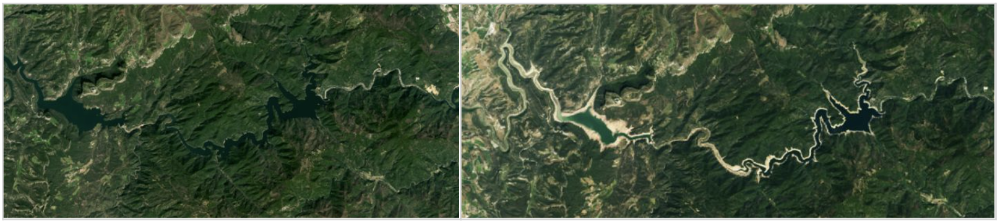


According to the Catalan Water Agency, the Sau Reservoir stood at only 7% of its capacity on April 25, 2023. The Susqueda Reservoir also had diminished water levels, which stood at 38% of total capacity on April 25 as well. Across all of Catalonia, reservoirs averaged about one-quarter of capacity.

These current events motivated us to begin our project. We utilize the soil moisture dataset from the Soil Moisture Active Passive (SMAP) satellite. This is a Level-4 Soil Moisture product, which includes around 50 variables that have been correlated with predicting surface soil moisture. From these variables, we chose precipitation, evapotranspiration, and surface temperature to predict the top layer soil moisture (0-5 cm) levels in the Catalonia region of Spain from 2015 to 2023. We begin with a baseline ConvLSTM model and take a sliding window of one week as input, where each day of the week is represented as a 4-layer deep tensor of pixel values, with a dimension of 94x166. 

We then expand our modeling techniques to a Vision Transformer, where we again utilize a sliding window, but take 28 days as input and predict one week as an output. These two models aim to forecast point estimates for the soil moisture. We then extended this to predict ranges using a Bayesian Vision Transformer which incorporates probabilistic modeling to estimate the uncertainty in our predictions. The resulting model is able to provide a range of possible outcomes, which we believe can be more useful for decision-making.

In conclusion, conservation of water resources is crucial, and our project aims to help farmers and land managers know the proper timings and levels of soil moisture to water efficiently and intentionally. Ultimately, our project statement is this: Utilize spatiotemporal data of soil moisture, surface temperature, evapotranspiration, and precipitation from the SMAP satellite to forecast soil moisture into the future and aid water conservation efforts in Catalonia.



Citations:<br>
AccuWeather. (2023, April 20). Harsh drought in Spain uncovers 11th-century wonder. Retrieved April 26, 2023, https://www.accuweather.com/en/climate/harsh-drought-in-spain-uncovers-11th-century-wonder/1515306

ABC News. (2023, April 20). Satellite images highlight extreme drought in Europe. Retrieved April 26, 2023, https://abcnews.go.com/International/satellite-images-highlight-extreme-drought-europe/story?id=98484112&cid=social_twitter_wnt

Associated Press. (2023, March 21). Drought in Spain’s northeast empties reservoirs. Retrieved April 26, 2023, https://apnews.com/article/spain-drought-barcelona-reservoirs-956fc841cec86c8fca42686c3c513c54

BBC. (2023, April 4). Climate change: Catalonia in grip of worst drought in decades. Retrieved April 26, 2023, https://www.bbc.com/news/world-europe-65129735

Catalan News. (2023, March 7). Stricter water restrictions come into effect in parts of Catalonia due to drought. Retrieved April 26, 2023, https://www.catalannews.com/society-science/item/stricter-water-restrictions-come-into-effect-in-parts-of-catalonia-due-to-drought

Catalan Water Agency (Agència Catalana de l’Aigua, ACA). (2023, April 25). State of the reservoirs of internal basins. Retrieved April 25, 2023, https://info.aca.gencat.cat/ca/aca/informacio/informesdwh/dades_embassaments_ca.pdf

France 24. (2023, April 19). Water rationed in Catalonia as drought bites deeper. Retrieved April 26, 2023, https://www.france24.com/en/live-news/20230419-water-rationed-in-catalonia-as-drought-bites-deeper

European Union, Copernicus Sentinel-2 imagery. (2023, March 16). The impact of the ongoing drought on the Sau Reservoir in Catalunya. Retrieved April 26, 2023, https://www.copernicus.eu/en/media/image-day-gallery/impact-ongoing-drought-sau-reservoir-catalunya

Reuters. (2023, April 25). Spain braces for scorching summer temperatures in spring. Retrieved April 26, 2023, https://www.reuters.com/world/americas/spain-braces-week-scorching-summer-temperatures-spring-2023-04-25/


#ETL PIPELINE

## Imports and authentication

In [ ]:
# Run these and then comment out after running. Do not modify!!
# !pip install rasterio
# !pip install gcsfs
# !pip install hvplot
# !pip install earthengine-api
# !pip install tensorflow
# !pip install geopandas
# !pip install statsmodels
# !pip install folium
# !pip install xarray
#!pip install git+https://github.com/jasonkyungkim/visualkeras
#!pip install pydot
#!pip install graphviz

In [ ]:
from google.cloud import storage
from google.oauth2 import service_account
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


In [ ]:
import matplotlib.pyplot as plt
import folium
import os
import io

from tqdm import tqdm

import requests
from datetime import datetime, timedelta

from PIL import Image
from io import BytesIO
import re

import colorcet as cc
import numpy as np

import time
from tqdm import tqdm

import pandas as pd
import random

import pickle
import rasterio
import gcsfs
import shutil
from scipy import stats

import xarray as xr
import hvplot.xarray

from IPython.display import display

from rasterio.io import MemoryFile

import matplotlib.cm as cm

from sklearn.model_selection import train_test_split

from collections import defaultdict
import visualkeras

import ee
import folium
import xarray as xr
import tensorflow as tf
from tf.keras.layers import ConvLSTM2D, MaxPooling2D, Dense, Flatten, Reshape
from keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.preprocessing import MinMaxScaler

from tensorflow import keras
import geopandas as gpd

import statsmodels.api as sm
from pylab import rcParams

import warnings
warnings.filterwarnings("ignore")

# plot the data
import matplotlib
import matplotlib.pyplot as plt

from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_pacf
from matplotlib.collections import PolyCollection, LineCollection

# Bayesian ViT
import torch
import torch.nn as nn
import pyro
from pyro.nn import PyroModule, PyroSample
from pyro.distributions import Normal

import pytz
import sklearn
import torch.optim as optim
from torchvision import transforms
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import DataLoader, TensorDataset

2023-05-08 11:13:46.152136: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
# Path to your JSON key file in Google Drive
key_file_path = './key-file.json'
# Create Google Cloud Storage API credentials
credentials = service_account.Credentials.from_service_account_file(key_file_path)

# Initialize the Google Cloud Storage client with the custom credentials
client = storage.Client(credentials=credentials)

`ee.Authenticate()` initiates the authentication process with Google Earth Engine (GEE), which allows you to access GEE resources and services programmatically. 

`ee.Initialize()` initializes the Earth Engine Python API. It must be called once in every session to initialize the connection with GEE servers. This function sets up a local connection to the Earth Engine Python API server using credentials stored in the user's Earth Engine configuration file.

In [ ]:
# Define visualisation parameters:

# Create a custom color palette using colorcet
customPalette = cc.rainbow

# Convert the colorcet palette to an Earth Engine palette
eePalette = [c[1:] for c in customPalette]

# Set visualization parameters
smSurfaceVis = {
  'min': 0.0,
  'max': 0.9,
  'palette': ['0300ff', '418504', 'efff07', 'efff07', 'ff0303']
}

SurfaceTempVis = {
  'min': 180,
  'max': 350,
  #'palette': ['0300ff', '418504', 'efff07', 'efff07', 'ff0303'], 
  'palette': eePalette
}

# Define the visualization parameters for the precipitation layer
PrecipitationVis = {
    'min': 0,
    'max': 0.05,
    'palette': eePalette
}

# Define the visualization parameters for the evapotranspiration layer
EvapotranspirationVis = {
    'min': -0.001,
    'max': 0.001,
    'palette': eePalette
}

## ETL

### Extracting Google Tiff Files

We are retrieving the Level 4 dataset from Google Earth Engine (GEE), a cloud-based platform for planetary-scale geospatial analysis that allows users to access and analyze petabytes of satellite imagery and other geospatial data for applications such as mapping, forestry, and climate change research.


Level 4 refers to data that has geophysical parameters derived from Level 1, 2, or 3 data that have been spatially and/or temporally re-sampled to a global grid. 


In [ ]:
# Define a region for Catalonia

#Catalonia
region = ee.Geometry.Polygon([
    [1.46263, 42.12981],     # Northwest
    [2.94066, 42.12981],     # Northeast
    [2.94066, 41.29172],     # Southeast
    [1.46263, 41.29172]      # Southwest
])

Pseudo code for how we retrived the images from GEE.

`Example for evapotranspiration`
`Create a map object`
`myMap = folium.Map(location=center, zoom_start=zoom, bounds=bounds)`

`Convert the ee.Image to a folium layer`
`foliumLayer = folium.TileLayer(`
    `tiles=bands['evapotranspiration'].getMapId(EvapotranspirationVis)` 
    `['tile_fetcher'].url_format,`
    `attr='Map Data &copy; <a href="https://earthengine.google.com/">Google`
    `Earth Engine</a>',`
    `overlay=True,`
    `name='Evapotranspiration'`
`)`

`Add the layer to the map`
`foliumLayer.add_to(myMap)`

`Add the layer control to the map`
`myMap.add_child(folium.LayerControl())`

### Transform and Store into Google S bucket

We design a function that takes in several inputs:

`date_str`: a string representing the date
`image`: an Earth Engine image to be downloaded and saved as a GeoTIFF file
`vis_params`: visualization parameters for the image
`region`: the area of the Earth that the image covers
`bucket_name`: the name of the Google Cloud Storage bucket where the file will be saved
`file_name_prefix`: a prefix to add to the file name (which varies depending on the band we want)

The function first retrieves the projection parameters from the input image, and then reprojects the image using these parameters.

It then generates a download URL for the image with specified options such as the format (GeoTIFF), projection (EPSG:4326), maximum number of pixels (1e13), and scale (1000). The function uses this URL to download the image using the `requests` library.

Next, the function uses the `google-cloud-storage` library to upload the GeoTIFF file to our Google Cloud Storage bucket. 

The `upload_from_string` method of the blob object uploads the file content to the bucket with the specified content type (application/x-geotiff).


Prior to this we created a GCP bucket obeying the least-privilege principle for Cloud architecture and gave all users only the required permissions. The data is saved in the "standard" storage class for immediate retrieval capabilities. 

In [ ]:
def save_geotiff(date_str, image, vis_params, region, bucket_name, file_name_prefix):
    """
    Save a GeoTIFF file to a Google Cloud Storage bucket.

    Parameters:
        - date_str (str): Date string to use in the file name.
        - image (ee.Image): Earth Engine image to save as GeoTIFF.
        - vis_params (dict): Visualization parameters for the image.
        - region (ee.Geometry): Geometry of the region to export.
        - bucket_name (str): Name of the Google Cloud Storage bucket.
        - file_name_prefix (str): Prefix to use in the file name.

    Returns:
        None
    """
    # Get the projection parameters from the first image
    image_projection = image.projection().getInfo()

    # Reproject the image using the projection parameters
    image = image.reproject(
        crs=image_projection['crs'],
        crsTransform=image_projection['transform']
    )

    url = image.getDownloadURL({
        'region': region,
        'format': 'GeoTIFF',
        'crs': 'EPSG:4326',
        'maxPixels': 1e13,
        'scale': 1000,
        'skipEmptyTiles': True
    })

    response = requests.get(url, stream=True)
    response.raise_for_status()

    # Save image to Google Cloud Storage bucket
    client = storage.Client(project='Data_Science_Project')
    bucket = client.get_bucket(bucket_name)
    blob = bucket.blob(f"{file_name_prefix}_{date_str}.tif")
    blob.upload_from_string(response.content, content_type="application/x-geotiff")

In [ ]:
#### Soil moisture

band_of_interest = 'smSurface'

# Set your Google Cloud Storage bucket name
bucket_name = 'smap-satellite-images-reduced'
file_name_prefix = band_of_interest

# Get the projection of the first image in the dataset
first_image_projection = dataset.first().projection()

# Iterate through the date range and save images to Google Cloud Storage
start = datetime.strptime(start_date, '%Y-%m-%d')
end = datetime.strptime(end_date, '%Y-%m-%d')
delta = timedelta(days=1)

date_range = int((end - start).days + 1)

for _ in tqdm(range(date_range), desc="Processing"):
    date_str = start.strftime('%Y-%m-%d')

    try:
        image = bands[band_of_interest].filter(ee.Filter.date(date_str, (start + delta).strftime('%Y-%m-%d'))).first()

        if image:
            save_geotiff(date_str, image, smSurfaceVis, region, bucket_name, file_name_prefix)
        else:
            print(f"No image found for {date_str}")
      

    except Exception as e:
      print("Added all images. Please increase date range for more images.")

    start += delta

In [ ]:
band_of_interest = 'precipitation'

# Set your Google Cloud Storage bucket name
bucket_name = 'smap-satellite-images-reduced'
file_name_prefix = band_of_interest

# Get the projection of the first image in the dataset
first_image_projection = dataset.first().projection()

# Iterate through the date range and save images to Google Cloud Storage
start = datetime.strptime(start_date, '%Y-%m-%d')
end = datetime.strptime(end_date, '%Y-%m-%d')
delta = timedelta(days=1)

date_range = int((end - start).days + 1)

for _ in tqdm(range(date_range), desc="Processing"):
    date_str = start.strftime('%Y-%m-%d')

    try:
        image = bands[band_of_interest].filter(ee.Filter.date(date_str, (start + delta).strftime('%Y-%m-%d'))).first()

        if image:
            save_geotiff(date_str, image, PrecipitationVis, region, bucket_name, file_name_prefix)
        else:
            print(f"No image found for {date_str}")

    except Exception as e:
        print("Added all images. Please increase date range for more images.")

    start += delta

In [ ]:
band_of_interest = 'evapotranspiration'

# Set your Google Cloud Storage bucket name
bucket_name = 'smap-satellite-images-reduced'

file_name_prefix = band_of_interest

# Get the projection of the first image in the dataset
first_image_projection = dataset.first().projection()

# Iterate through the date range and save images to Google Cloud Storage
start = datetime.strptime(start_date, '%Y-%m-%d')
end = datetime.strptime(end_date, '%Y-%m-%d')
delta = timedelta(days=1)

date_range = int((end - start).days + 1)

for _ in tqdm(range(date_range), desc="Processing"):
    date_str = start.strftime('%Y-%m-%d')

    try:
        image = bands[band_of_interest].filter(ee.Filter.date(date_str, (start + delta).strftime('%Y-%m-%d'))).first()

        if image:
            save_geotiff(date_str, image, EvapotranspirationVis, region, bucket_name, file_name_prefix)
        else:
            print(f"No image found for {date_str}")

    except Exception as e:
        print("Added all images. Please increase date range for more images.")

    start += delta

In [ ]:
band_of_interest = 'surface_temp'

# Set your Google Cloud Storage bucket name
bucket_name = 'smap-satellite-images-reduced'
file_name_prefix = band_of_interest

# Get the projection of the first image in the dataset
first_image_projection = dataset.first().projection()

# Iterate through the date range and save images to Google Cloud Storage
start = datetime.strptime(start_date, '%Y-%m-%d')
end = datetime.strptime(end_date, '%Y-%m-%d')
delta = timedelta(days=1)

date_range = int((end - start).days + 1)

for _ in tqdm(range(date_range), desc="Processing"):
    date_str = start.strftime('%Y-%m-%d')

    try:
        image = bands[band_of_interest].filter(ee.Filter.date(date_str, (start + delta).strftime('%Y-%m-%d'))).first()

        if image:
            save_geotiff(date_str, image, SurfaceTempVis, region, bucket_name, file_name_prefix)
        else:
            print(f"No image found for {date_str}")

    except Exception as e:
        print("Added all images. Please increase date range for more images.")

    start += delta

### Downloading images from Google Cloud Platform Bucket onto local machine

The below code will connect to the 

In [ ]:
# Non-reduced Bucket - Spain and Portucal 
# Set up the GCS client for grabbing data for map visualization
bucket_name_for_maps = "smap-satellite-images"
bucket_for_maps = client.get_bucket(bucket_name_for_maps)

In [ ]:
# Reduced Bucket : Catalonia region 
# Set up the GCS client for grabbing data for analysis
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = key_file_path
client = storage.Client()
bucket_name = "smap-satellite-images-reduced"
bucket = client.get_bucket(bucket_name)

# EDA

## Exploring and Visualizing Satelite Images

Once we figured out how to extract and store the google satelite image data we loaded a sample into our notebook and began exploring a wide geographical area, Spain and Portugal.

###One Day Snap Shots of the Spain/Portugal Region


Load data from S bucket

In [ ]:
# List the files in the GCP bucket
blobs_for_maps = list(bucket_for_maps.list_blobs())

# Download the GeoTIFF files and store them in the dictionary
file_patterns = {
    'sm': re.compile(r'^smSurface_\d{4}-\d{2}-\d{2}\.tif$'),
    'temp': re.compile(r'^surface_temp_\d{4}-\d{2}-\d{2}\.tif$'),
    'evap': re.compile(r'^evapotranspiration_\d{4}-\d{2}-\d{2}\.tif$'),
    'precip': re.compile(r'^precipitation_\d{4}-\d{2}-\d{2}\.tif$'),
}
geo_files_for_maps = {key: [] for key in file_patterns}

# Group blobs by file type
blobs_by_type_for_maps = {key: [] for key in file_patterns}
for blob2 in blobs_for_maps:
    file_name = blob2.name
    for key, pattern in file_patterns.items():
        if pattern.match(file_name):
            blobs_by_type_for_maps[key].append(blob2)

# Download files with progress bars
for key, blob_list in blobs_by_type_for_maps.items():
    print(f'Downloading {key} files:')
    # pull the most k many recent days of images
    for blob in tqdm(blob_list[-1:]):
        # Read the GeoTIFF file into memory and open it using rasterio
        with MemoryFile(blob.download_as_bytes()) as memfile:
            with memfile.open() as dataset:
                # Read the pixel values for the first band as a NumPy array
                data = dataset.read(1)
                # Replace NoData values with NaN
                data[np.isinf(data)] = np.nan
                geo_files_for_maps[key].append((data, blob.name)) 


100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


100%|██████████| 1/1 [00:00<00:00,  6.67it/s]


Plotting the satelite images

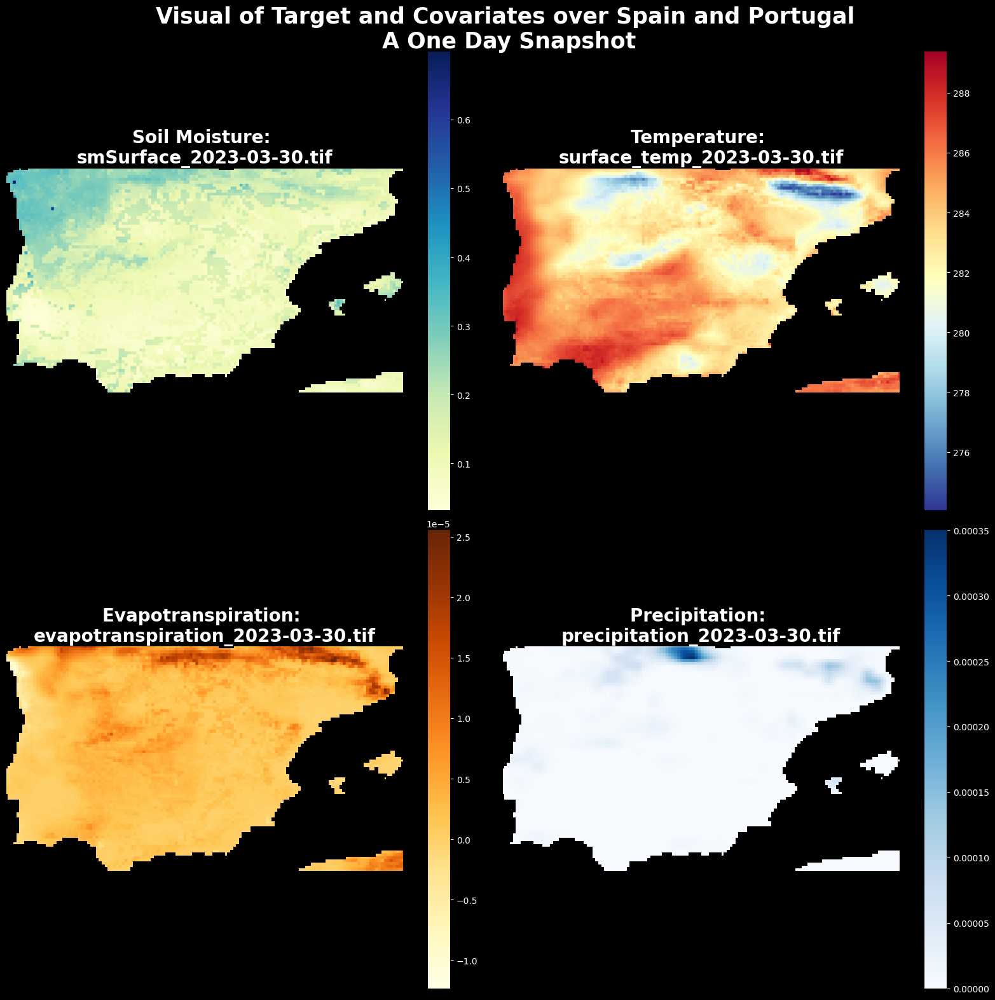

In [ ]:
# Define the data and colormap for each subplot
data_list = [geo_files_for_maps['sm'][0][0], geo_files_for_maps['temp'][0][0], geo_files_for_maps['evap'][0][0], geo_files_for_maps['precip'][0][0]]
cmap_list = [plt.cm.YlGnBu, plt.cm.RdYlBu_r, plt.cm.YlOrBr, plt.cm.Blues]

# Define the extent of the region
xmin, ymin, xmax, ymax = [-9.296875, 36.137874, 3.515625, 43.389081]
title_list = [f"Soil Moisture: \n{geo_files_for_maps['sm'][0][1]}", f"Temperature: \n{geo_files_for_maps['temp'][0][1]}", f"Evapotranspiration: \n{geo_files_for_maps['evap'][0][1]}", f"Precipitation: \n{geo_files_for_maps['precip'][0][1]}"]

colorbar_list = []
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(16, 16), facecolor='k')
# Loop through the subplots
for i, ax in enumerate(axs.flat):
    extent = [xmin, xmax, ymin, ymax]
    cmap = cmap_list[i]
    cmap.set_bad(color='black')
    im = ax.imshow(data_list[i], extent=extent, cmap=cmap)
    ax.set_title(title_list[i], color='white', fontsize=20, fontweight='bold')
    colorbar = fig.colorbar(im, ax=ax)
    colorbar.ax.tick_params(colors='white')
    colorbar_list.append(colorbar)

# Turn off the axis for all subplots
for ax in axs.flat:
    ax.set_axis_off()

fig.suptitle('Visual of Target and Covariates over Spain and Portugal\n A One Day Snapshot', fontsize=25, fontweight='bold', color='white')
plt.tight_layout()
plt.show()

###Full Dataset of Catalonia Region in Spain

 Load full dataset from S bucket

We download the GeoTIFF files and group them by feature type, as defined by the regular expressions of the dates. We read each file into memory using `rasterio` and convert the bands to NumPy arrays. We also replace any NoData values in the array with NaN. The resulting NumPy arrays are stored in a dictionary called `geo_files`, keyed by feature type and the values of the keys are tuples. The elements of the tuple are the file data and file name. Every tuple corresponds to one daily reading over the entirety of our geographic region. In the following example, we look at the soil moisture file data for a time period of 1 year and we focus on the first day. We also check general information about our data files such as the shape of the arrays and the presence of NaN values. Lastly we plot a sample of the data too see what our predictor and covariates.

In [ ]:
n_days = 2948

# This creates a dictionary with the values being a tuple, with the numpy.array and the name of the file. 

# List the files in the GCP bucket
blobs = list(bucket.list_blobs())

# Download the GeoTIFF files and store them in the dictionary
file_patterns = {
    'sm': re.compile(r'^smSurface_\d{4}-\d{2}-\d{2}\.tif$'),
    'temp': re.compile(r'^surface_temp_\d{4}-\d{2}-\d{2}\.tif$'),
    'evap': re.compile(r'^evapotranspiration_\d{4}-\d{2}-\d{2}\.tif$'),
    'precip': re.compile(r'^precipitation_\d{4}-\d{2}-\d{2}\.tif$'),
}

# Create Dictionaries
geo_files = {key: [] for key in file_patterns}
blobs_by_type = {key: [] for key in file_patterns}

# Group blobs by file type
for blob in blobs:
    file_name = blob.name
    for key, pattern in file_patterns.items():
        if pattern.match(file_name):
            blobs_by_type[key].append(blob)

# Set counter variable
counter = {key: 0 for key in file_patterns}

# Download files with progress bars
for key, blob_list in blobs_by_type.items():
    print(f'Downloading {key} files:')

    for blob in tqdm(blob_list[-n_days:]): ### Change here for different pull counts ###

        # this if-break statement is to download the specified n_days worth of data

        if counter[key] >= n_days: ### And Change here for different pull counts ###
            break
        # Read the GeoTIFF file into memory and open it using rasterio
        with MemoryFile(blob.download_as_bytes()) as memfile:
            with memfile.open() as dataset:
                # Read the pixel values for the first band as a NumPy array
                data = dataset.read(1)
                # Replace NoData values with NaN
                data[np.isinf(data)] = np.nan
                geo_files[key].append((data, blob.name)) # Append tuple containing data and file name
                counter[key] += 1

100%|██████████| 2948/2948 [05:18<00:00,  9.26it/s]


100%|██████████| 2948/2948 [06:07<00:00,  8.03it/s]


100%|██████████| 2948/2948 [05:12<00:00,  9.44it/s]


100%|██████████| 2948/2948 [05:18<00:00,  9.24it/s]


Snapshot of the data - quick look at the at the data

In [ ]:
# geo_files is a dictionnary
type(geo_files)

dict

In [ ]:
# keys: sm for Soil Moisture / surface_temp for Surface Temperature / evapotranspiration / precipitation 
geo_files.keys()

dict_keys(['sm', 'temp', 'evap', 'precip'])

In [ ]:
# values: list of tuples:
# tuple[0]: numpy arrays containing the values for each feature
# tuple[1]: name of the numpy array

print(f"Time period: {len(geo_files['sm'])} days\n")

print(f"Example first day: values of Soil Moisture as type {type(geo_files['sm'][0][0])}:\n\n {geo_files['sm'][0][0]}\n\n")

print(f"Example first day: name of Soil Moisture as type {type(geo_files['sm'][0][1])}:\n {geo_files['sm'][0][1]}\n\n")

print(f"Example last day: values of Soil Moisture as type {type(geo_files['sm'][0][0])}:\n\n {geo_files['sm'][-1][0]}\n\n")

print(f"Example last day: name of Soil Moisture as type {type(geo_files['sm'][0][1])}:\n {geo_files['sm'][-1][1]}\n\n")

print(f"Shapes of arrays per category, corresponding to geographic region:\n\nSoil Moisture: {geo_files['sm'][1][0].shape}\nPrecipitation: {geo_files['precip'][1][0].shape} \nEvapotranspiration: {geo_files['evap'][1][0].shape} \nSurface Temperature: {geo_files['temp'][1][0].shape}\n\n")

#https://stackoverflow.com/questions/6736590/fast-check-for-nan-in-numpy
print(f"Check NaN in arrays per category. This represents water, not land:\n\nSoil Moisture: {np.isnan(np.sum(geo_files['sm'][1][0]))}\nPrecipitation: {np.isnan(np.sum(geo_files['precip'][1][0]))} \nEvapotranspiration: {np.isnan(np.sum(geo_files['evap'][1][0]))} \nSurface Temperature: {np.isnan(np.sum(geo_files['temp'][1][0]))}")


Time period: 2948 days

Example first day: values of Soil Moisture as type <class 'numpy.ndarray'>:

 [[0.13333398 0.13333398 0.12924463 ... 0.26681787 0.26681787 0.26681787]
 [0.13333398 0.13333398 0.12924463 ... 0.26681787 0.26681787 0.26681787]
 [0.13333398 0.13333398 0.12924463 ... 0.26681787 0.26681787 0.26681787]
 ...
 [0.15890771 0.15890771 0.17599756 ...        nan        nan        nan]
 [0.15890771 0.15890771 0.17599756 ...        nan        nan        nan]
 [0.15890771 0.15890771 0.17599756 ...        nan        nan        nan]]


Example first day: name of Soil Moisture as type <class 'str'>:
 smSurface_2015-04-08.tif


Example last day: values of Soil Moisture as type <class 'numpy.ndarray'>:

 [[0.1127038  0.1127038  0.1088891  ... 0.17712641 0.17712641 0.17712641]
 [0.1127038  0.1127038  0.1088891  ... 0.17712641 0.17712641 0.17712641]
 [0.1127038  0.1127038  0.1088891  ... 0.17712641 0.17712641 0.17712641]
 ...
 [0.1071496  0.1071496  0.11654902 ...        nan        na

Visualizing 3 random images from the reduced data set: Catalonia/Barcelona region. 

In [ ]:
## Select three random elements from image_tuple to visualize
random_file_names = []
random_file_data = []

for category, image_tuple in geo_files.items():
    random_samples = random.sample(image_tuple, 3)
    
    for data, name in random_samples:
        random_file_data.append(data)
        random_file_names.append(name[:-4])
random_file_data = np.array(random_file_data)
random_file_name = np.array(random_file_names)

In [ ]:
## Modify plot function to output an entire subplot with labels in title
def plot_images(file_data, file_names):
    fig, axes = plt.subplots(4, 3, figsize=(15, 15))
    fig.subplots_adjust(hspace=0.4)
    fig.suptitle("Three Random Images per Variable", fontsize=20, y=0.95)
    categories = list(geo_files.keys())
    for i in range(len(categories)):
        for j in range(3):
            img_data = file_data[i*3+j]
            img_name = file_names[i*3+j]
            ax = axes[i, j]
            im = ax.imshow(img_data, cmap='viridis')
            ax.set_title(f'Image {j + 1}: {img_name}')
            ax.axis('off')
            # Add a colorbar
            fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)

    plt.show()

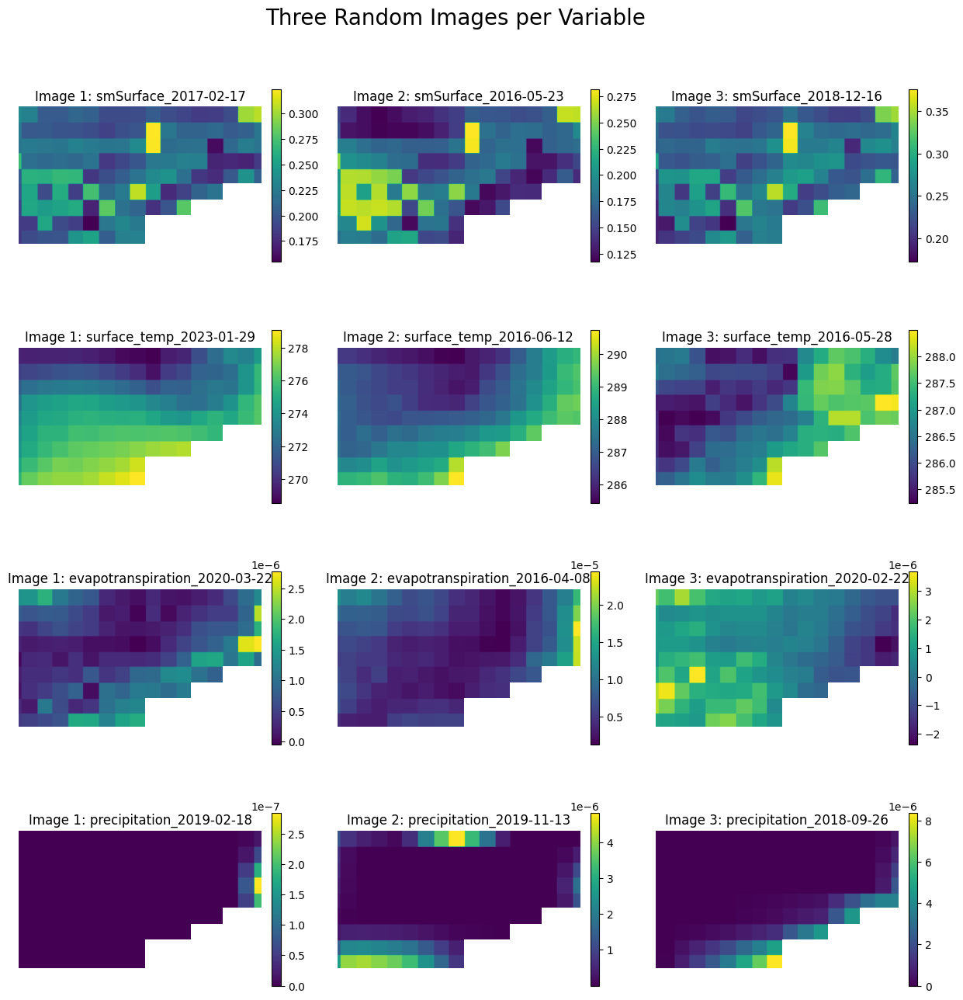

In [ ]:
plot_images(random_file_data, random_file_names)

## Trend Analysis

### Summary of Time Series 

Soil moisture is the amount of water in land surfaces, excluding water areas such as lakes, rivers, or groundwater. Our data specifically pertains to the water that is in the upper 5 cm of soil. Both soil moisture and precipitation data can be used to determine the severity of a drought in different areas, as there is no single definition of a drought, and to that end, there are many quantifiable metrics that are used to measure drought. While there isn’t a specific level of soil moisture that indicates a drought and the exact threshold for drought varies depending on context, values below 0.20 m3/m3 are generally considered as an indicator of drought.

Inspecting our plots regarding soil moisture trends through March 31st, 2022 and March 30th, 2023, we see soil moisture levels peaking in late spring and early winter, as does evapotranspiration; surface temperature peaks in the summer; both evapotranspiration and precipitation have uniform mean averages with very high spikes here and there. Note that negative evapotranspiration values denote condensation.

Furthermore, since we intend to use evapotranspiration, surface temperature and precipitation as predictors for soil moisture, we found it interesting to provide the correlation matrix of these variables. This does not ensure that the predictors will be relevant but this is a common quick check to see if the variables change together or not.


In [ ]:
length = len(geo_files['sm'])
length

2948

In [ ]:
# Creating averages, maxes, and mins into dictionaries
vars = ['sm','temp','evap','precip']
avgs = {var: [] for var in vars}
maxes = {var: [] for var in vars}
mins = {var: [] for var in vars}

In [ ]:
for var in vars:
    for i in range(length):
        avgs[var].append(np.nanmean(geo_files[var][i][0]))
        maxes[var].append(np.nanmax(geo_files[var][i][0]))
        mins[var].append(np.nanmin(geo_files[var][i][0]))

In [ ]:
# Ignoring xtick warnings


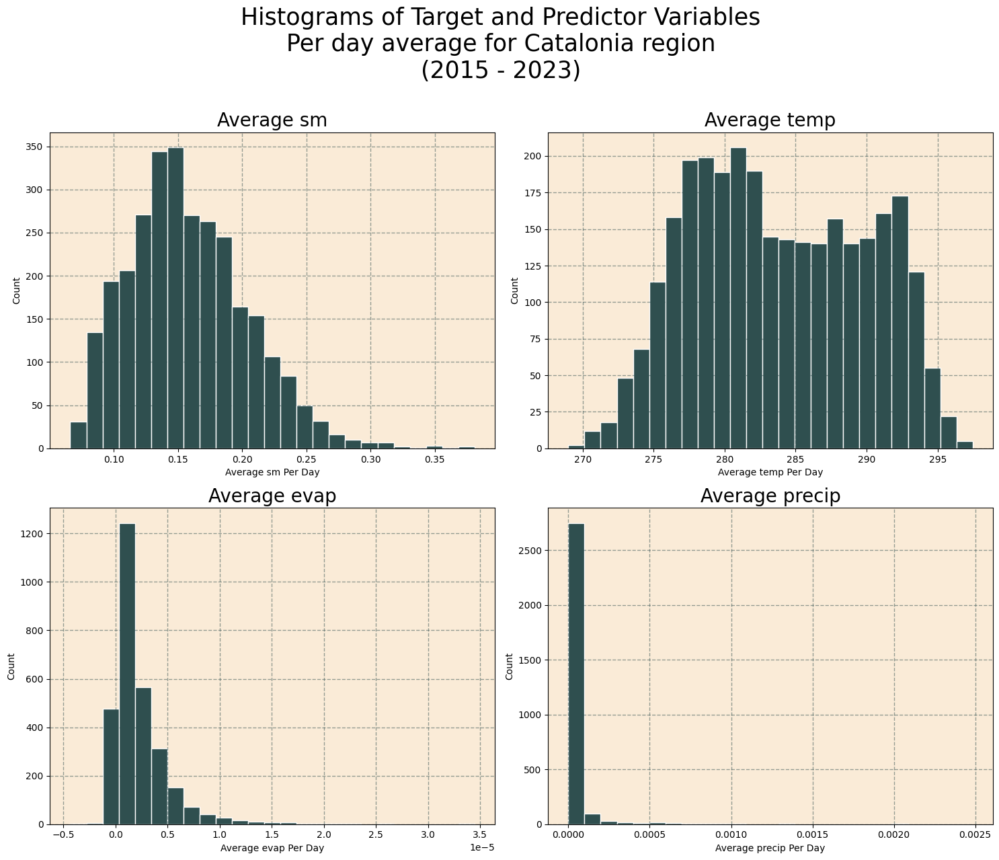

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 13))
axs = axs.flat

plt.suptitle('Histograms of Target and Predictor Variables\nPer day average for Catalonia region\n(2015 - 2023)\n', fontsize = '25')

for var, ax in zip(vars, axs):
    ax.set_facecolor('antiquewhite')
    ax.grid(color='darkslategrey', alpha=0.5, linestyle='dashed', linewidth=1)
    ax.hist(avgs[var], color='darkslategrey', bins = 25, edgecolor = 'white')
    ax.set_title(f'Average {var}', fontsize= '20')
    ax.set_xlabel(f'Average {var} Per Day')
    ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

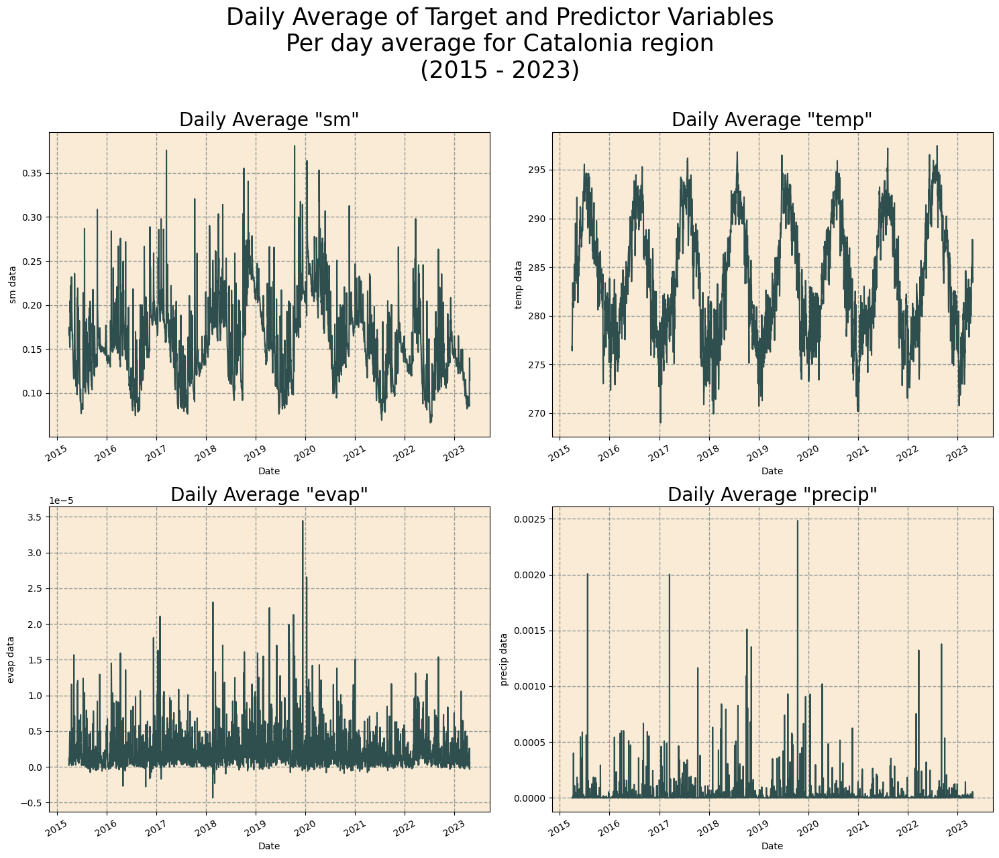

In [ ]:
x = np.arange('2015-03-31', '2023-04-26', dtype='datetime64[D]')


fig, axs = plt.subplots(2,2, figsize=(15,13))
plt.suptitle('Daily Average of Target and Predictor Variables\nPer day average for Catalonia region\n(2015 - 2023)\n', fontsize = '25')
axs = axs.flatten()

x_tickz = ['No Data', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023']
for i, var in enumerate(vars):
    axs[i].plot(x, avgs[var], color='darkslategrey')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel(f'{var} data')
    axs[i].set_title(f'Daily Average "{var}"', fontsize= '20')
    axs[i].set_facecolor('antiquewhite')
    axs[i].grid(color='darkslategrey', alpha=0.5, linestyle='dashed', linewidth=1)
    axs[i].set_xticklabels(x_tickz, rotation=30)
plt.tight_layout()
plt.show()

In the graphs above, we can see that there here are clear trends in the annual temp and soil moisture graphs, with what looks like a downward trend in the soil moisture graph. The other graphs, evap and precip experience their peaks at the end of 2019 and haven't experienced anything like that sense.

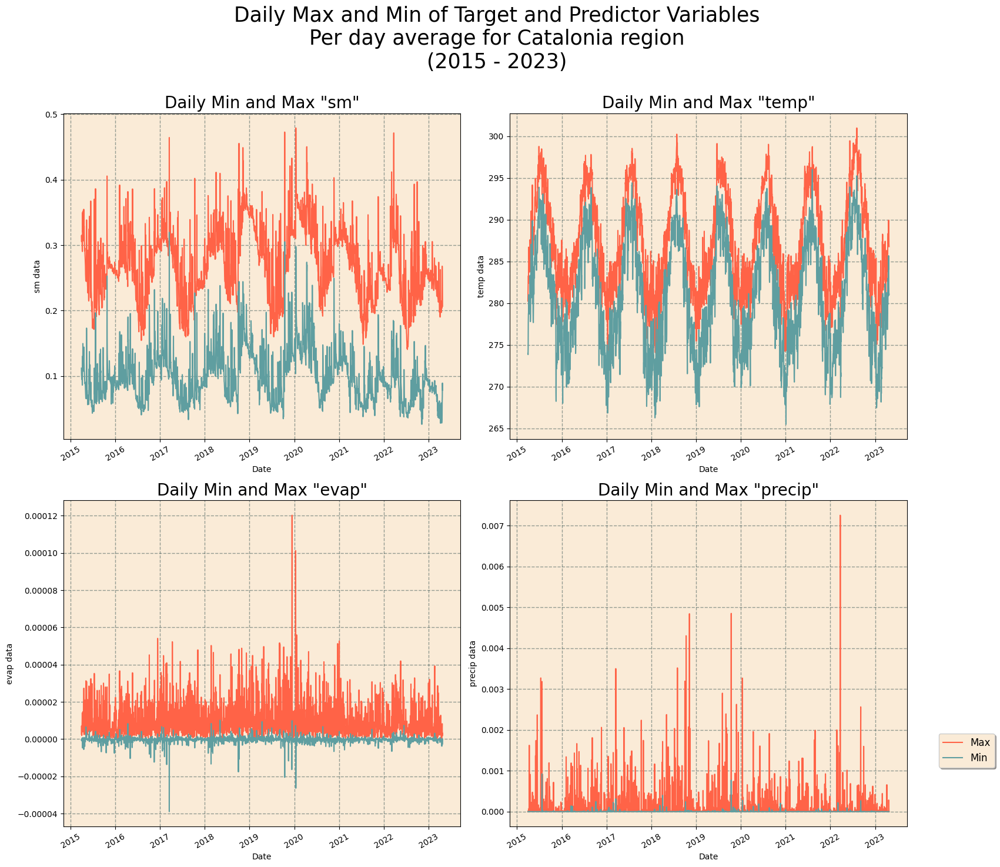

In [ ]:
fig, axs = plt.subplots(2,2, figsize=(17,15))
plt.suptitle('Daily Max and Min of Target and Predictor Variables\nPer day average for Catalonia region\n(2015 - 2023)\n', fontsize = '25')
axs = axs.flatten()

for i, var in enumerate(vars):
    axs[i].plot(x, maxes[var], label='Max', color='tomato')
    axs[i].plot(x, mins[var], label='Min', color='cadetblue')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel(f'{var} data')
    axs[i].set_title(f'Daily Min and Max "{var}"', fontsize = '20')
    axs[i].set_facecolor('antiquewhite')
    axs[i].grid(color='darkslategrey', alpha=0.5, linestyle='dashed', linewidth=1)
    axs[i].set_xticklabels(x_tickz, rotation=30)

legend = plt.legend(loc='upper center', bbox_to_anchor=(1.15, 0.3), shadow=True, labelcolor='w', fontsize='large')
legend.get_texts()[0].set_color("black")
legend.get_texts()[1].set_color("black")
legend.get_frame().set_facecolor('antiquewhite')
plt.tight_layout()
plt.show()

### Time Series Analysis

Since we are dealing with time series, it is relevant for us to examine the seasonality of our data. Indeed, the seasonality may act as a potential confounding variable and impact our analysis. Thus, we examined the Annual, quarterly, monthly and weekly seasonalities of our time series. Our first intuition without analyzing the data was that we should see quarterly seasonality corresponding to the four annual seasons for our features (soil moisture, precipitation, surface temperature, evapotranspiration), but that the monthly and weekly seasonalities might not be significant. First, we decomposed our time series into three components: trend, seasonal and residuals. In the following, we consider additive models since the seasonality magnitude seems to remain approximately constant over time in our time series.


In [ ]:
# https://stackoverflow.com/questions/45184055/how-to-plot-multiple-seasonal-decompose-plots-in-one-figure
# Defining the function we will use.

def plotseasonal(res, fig, axes, period, var):
    lines = [(res.observed, 'Observed'), (res.trend, 'Trend'), (res.seasonal, 'Seasonal')]
    x = np.arange(len(res.trend))
    axes[0].set_title(f'Daily Average "{var}" Data Decompostion \n Period: {period}', fontsize=13)
    for i in range(3):
        axes[i].plot(x, lines[i][0], color='darkslategrey', linewidth=0.9)
        axes[i].set_ylabel(lines[i][1])
        axes[i].set_facecolor('antiquewhite')
        axes[i].grid(color='darkslategrey', alpha=0.5, linestyle='dashed', linewidth=1)
    axes[3].scatter(x, res.resid, s=5, color='darkslategrey')
    axes[3].axhline(y=0, color='black', linestyle='-')
    axes[3].set_ylabel('Residual')
    axes[3].set_facecolor('antiquewhite')
    axes[3].grid(color='darkslategrey', alpha=0.5, linestyle='dashed', linewidth=1)
    axes[3].set_xlabel("Date (in days)")
    fig.suptitle(f"{period} Decomposition of daily averages time series", y=1.02, fontsize=22)

# Zoom in seasonality
def zoom_in_seasonality(res, fig, axes, period, var):
    x = np.arange(len(res.seasonal))
    axes.set_title(f'Daily Average "{var}" Data Decompostion \n Period: {period}', fontsize=13)
    axes.plot(x[-70:], res.seasonal[-70:], color='darkslategrey', linewidth=3)
    axes.set_xlabel('Date (in days)')
    axes.set_ylabel('Seasonal')
    axes.set_facecolor('antiquewhite')
    axes.grid(color='darkslategrey', alpha=0.5, linestyle='dashed', linewidth=1)
    fig.suptitle(f"Zoom in seasonality for {period} Decomposition of daily averages (last 70 days)", y=1.02, fontsize=22)

The code below creates an empty dictionary quarter_seasonality. It then iterates over a list of variables vars and applies the statsmodels.tsa.seasonal.seasonal_decompose function, and we're specifically looking at 'observed', 'trend', 'seasonal', and 'residuals'.

- 'Observed': observed values!

- 'Trend': The trend component represents the long-term movement of a time series over time. It is often described as the underlying growth or decline of the time series, and it can be influenced by many factors such as economic conditions, demographic changes, and technological advances. The trend component is typically estimated using a smoothing technique such as a moving average or a regression model. In a decomposed time series, the trend component represents the estimated long-term pattern in the data, after removing the seasonal and residual components.

- 'seasonal': The seasonal component represents the regular and repeating patterns in a time series that occur within a fixed time period. For example, daily temperature measurements may exhibit a seasonal pattern where temperatures are higher in the summer and lower in the winter. The seasonal component is typically estimated by averaging the values of the time series over each season and subtracting the average value from each individual observation. In a decomposed time series, the seasonal component represents the estimated pattern in the data that repeats on a fixed time scale (i.e., the estimated seasonal variation).

- 'residuals': The estimated residual component of the time series (i.e., the part of the time series that cannot be explained by the trend or seasonal components).

We perform this analysis for Annual, Quarterly, Monthly, and Weekly bases.

Please see the interpretation of the plots below.

#### Annually

In [ ]:
yearly_seasonality = {}
for var in vars:
    yearly_seasonality[var] = sm.tsa.seasonal_decompose(avgs[var], period=365)

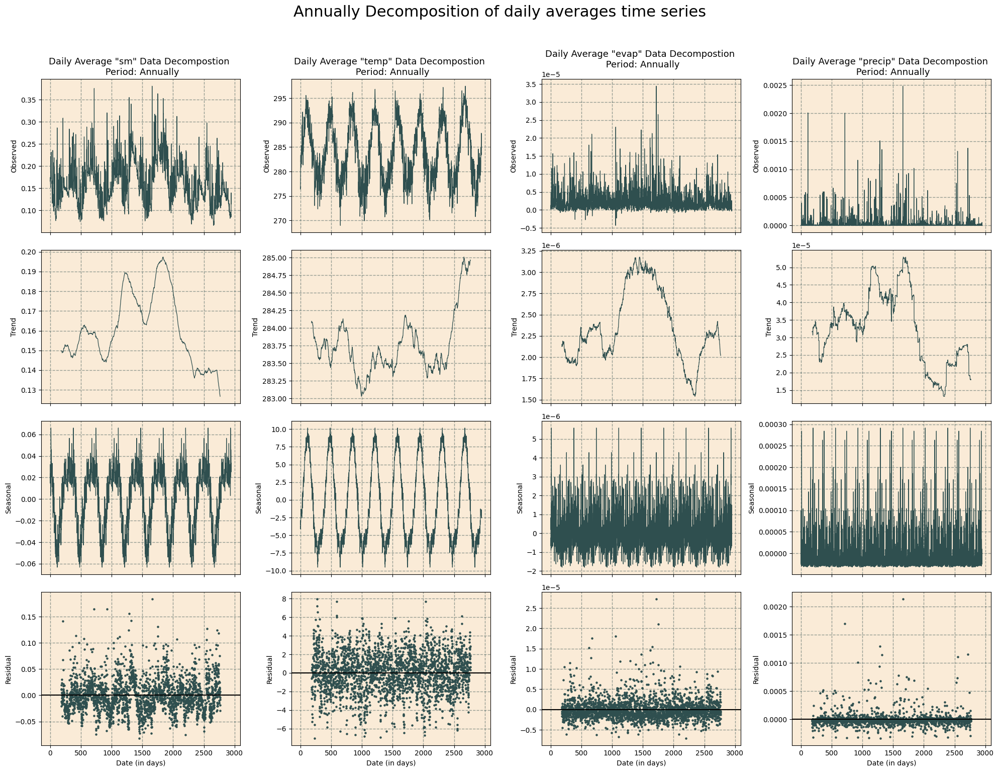

In [ ]:
fig, axes = plt.subplots(ncols=len(yearly_seasonality), nrows=4, sharex=True, figsize=(20,15))

for i, var in enumerate(vars):
    plotseasonal(yearly_seasonality[var], fig, axes[:,i], 'Annually', var)

plt.tight_layout()
plt.show()

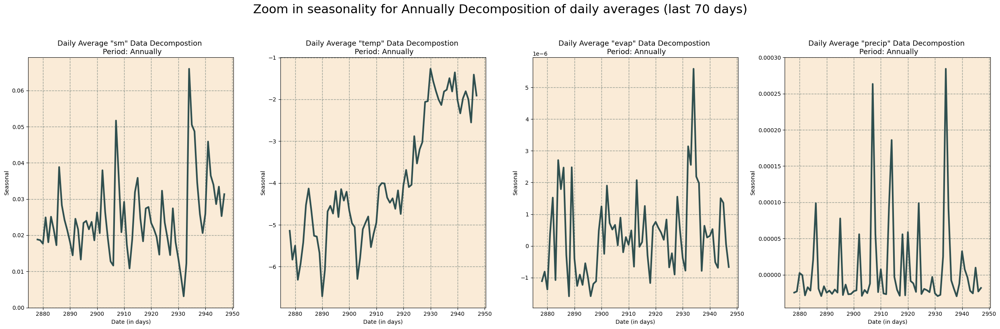

In [ ]:
fig, axes = plt.subplots(ncols=len(yearly_seasonality), nrows=1, sharex=True, figsize=(25,8))

for i, var in enumerate(vars):
    zoom_in_seasonality(yearly_seasonality[var], fig, axes[i], 'Annually', var)

plt.tight_layout()
plt.show()

#### Quarterly

In [ ]:
quarter_seasonality = {}
for var in vars:
    quarter_seasonality[var] = sm.tsa.seasonal_decompose(avgs[var], period=90)

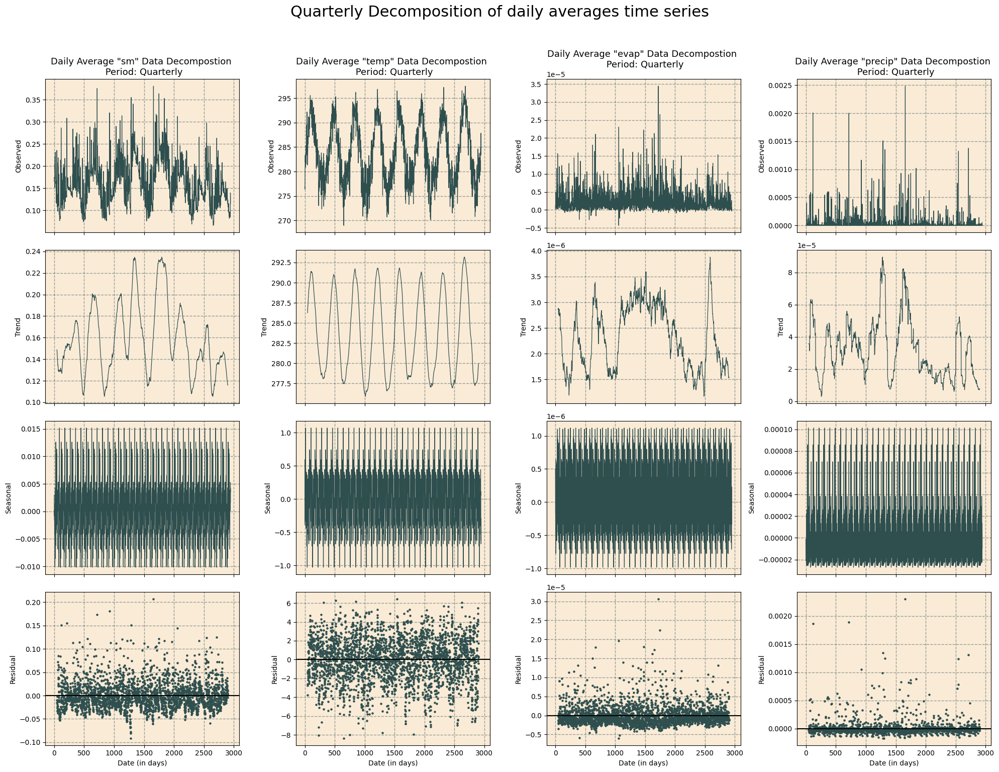

In [ ]:
fig, axes = plt.subplots(ncols=len(quarter_seasonality), nrows=4, sharex=True, figsize=(20,15))

for i, var in enumerate(vars):
    plotseasonal(quarter_seasonality[var], fig, axes[:,i], 'Quarterly', var)

plt.tight_layout()
plt.show()

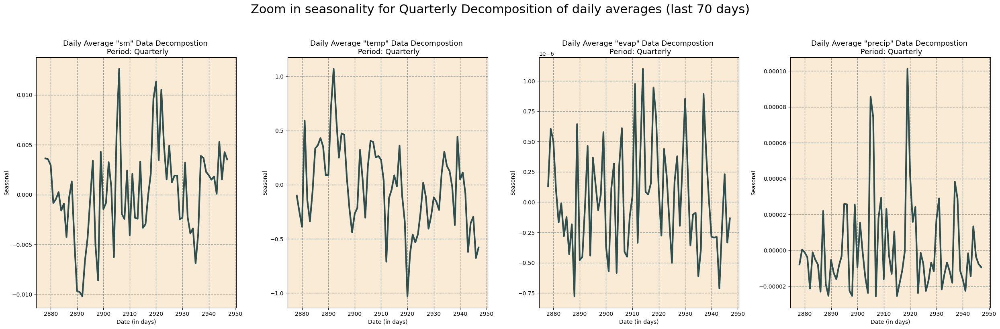

In [ ]:
fig, axes = plt.subplots(ncols=len(quarter_seasonality), nrows=1, sharex=True, figsize=(25,8))

for i, var in enumerate(vars):
    zoom_in_seasonality(quarter_seasonality[var], fig, axes[i], 'Quarterly', var)

plt.tight_layout()
plt.show()

#### Monthly

In [ ]:
month_seasonality = {}
for var in vars:
    month_seasonality[var] = sm.tsa.seasonal_decompose(avgs[var], period=30)

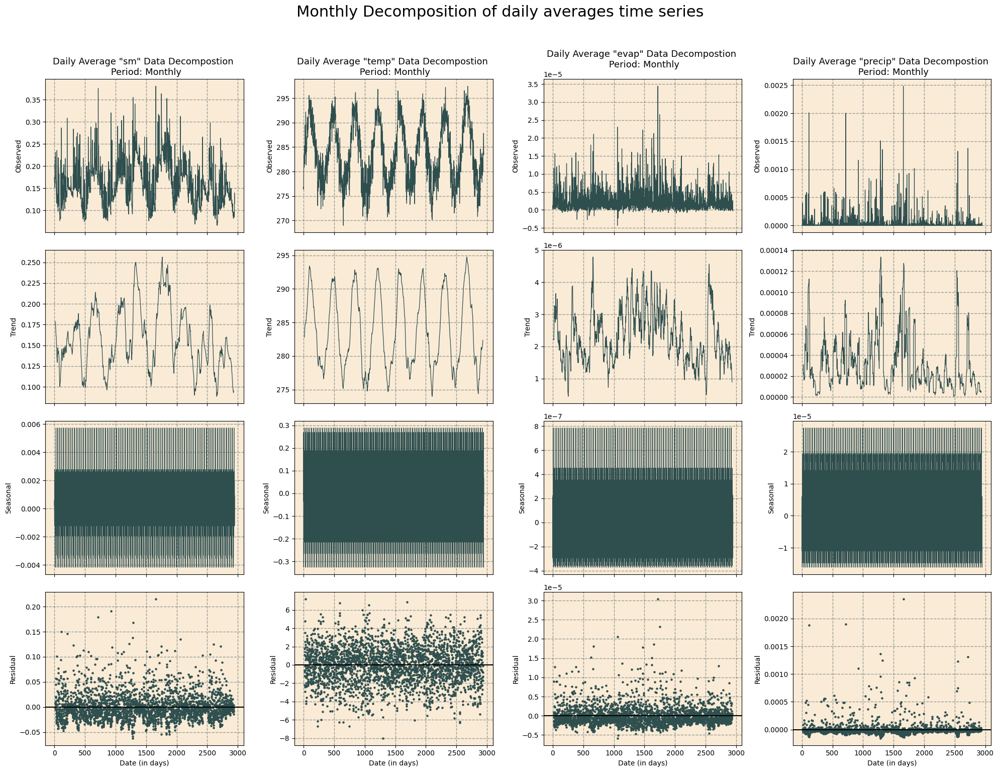

In [ ]:
fig, axes = plt.subplots(ncols=len(month_seasonality), nrows=4, sharex=True, figsize=(20,15))

for i, var in enumerate(vars):
    plotseasonal(month_seasonality[var], fig, axes[:,i], 'Monthly', var)

plt.tight_layout()
plt.show()

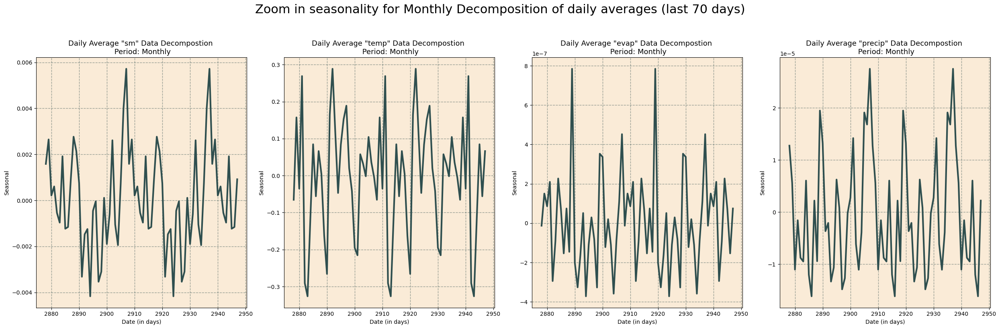

In [ ]:
fig, axes = plt.subplots(ncols=len(month_seasonality), nrows=1, sharex=True, figsize=(25,8))

for i, var in enumerate(vars):
    zoom_in_seasonality(month_seasonality[var], fig, axes[i], 'Monthly', var)

plt.tight_layout()
plt.show()

#### Weekly

In [ ]:
week_seasonality = {}
for var in vars:
    week_seasonality[var] = sm.tsa.seasonal_decompose(avgs[var], period=7)

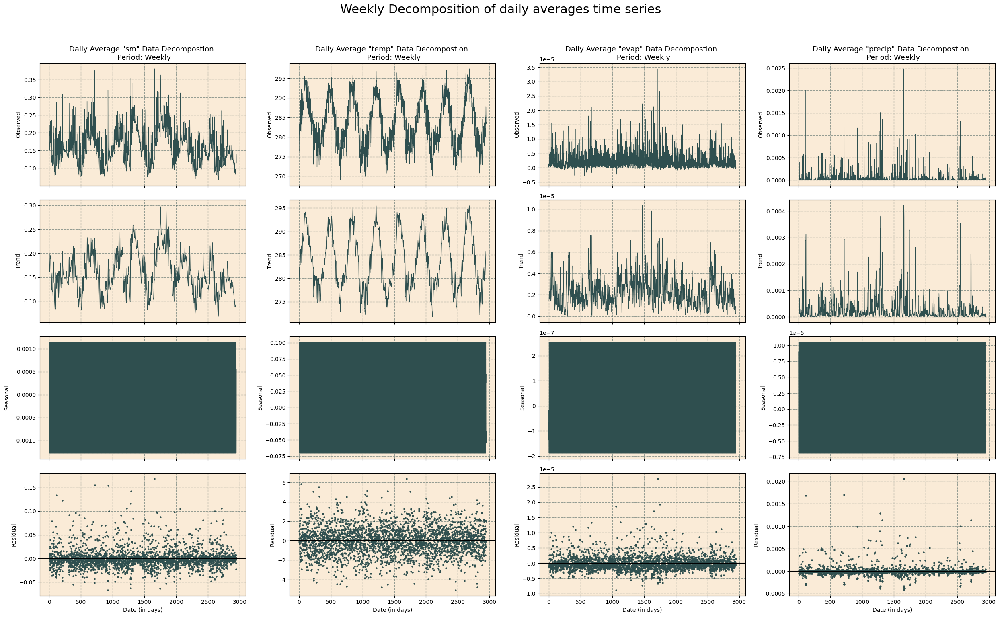

In [ ]:
fig, axes = plt.subplots(ncols=len(week_seasonality), nrows=4, sharex=True, figsize=(25,15))

for i, var in enumerate(vars):
    plotseasonal(week_seasonality[var], fig, axes[:,i], 'Weekly', var)

plt.tight_layout()
plt.show()

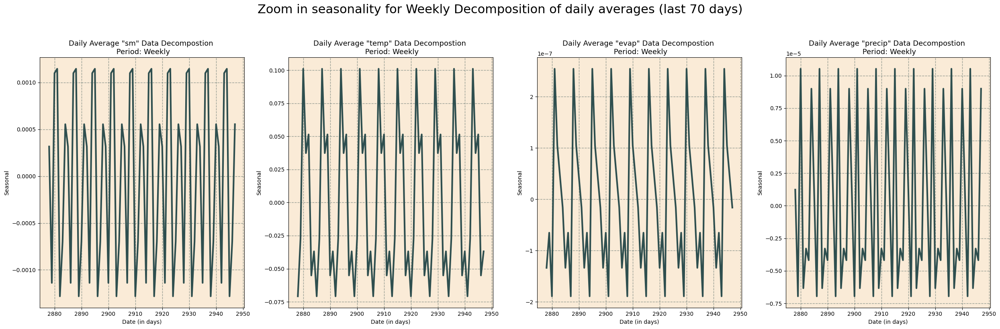

In [ ]:
fig, axes = plt.subplots(ncols=len(week_seasonality), nrows=1, sharex=True, figsize=(25,8))

for i, var in enumerate(vars):
    zoom_in_seasonality(week_seasonality[var], fig, axes[i], 'Weekly', var)

plt.tight_layout()
plt.show()

#### Seasonal Autocorrelations

The above plots are useful to visualize the seasonal components patterns in our time series. However, we do believe that it is more accurate to conclude about the presence of seasonality by plotting the partial autocorrelations of each time series, which tells us the correlation an observation and a past one (with a certain lag) after partialling out the intervening correlations (difference with autocorrelations). Let us take the example of the daily averages of precipitation. When a peak is outside of the colored area around zero (95% confidence interval around zero), it means that it is statistically significant (i.e. non-zero). 

Let us take the example of the daily averages of precipitation to see how to interpret these plots. For this one, we can clearly see the quarterly seasonality: peaks at lags 90 and 180 (given that a quarter is around 90 days). However, the monthly and weekly seasonalities are not clearly identified. 

Finally, we concluded that precipitation and evapotranspiration are quarterly seasonal, while we could not conclude to a clear seasonal pattern for soil moisture and surface temperature (the time period to consider for them may be higher).   


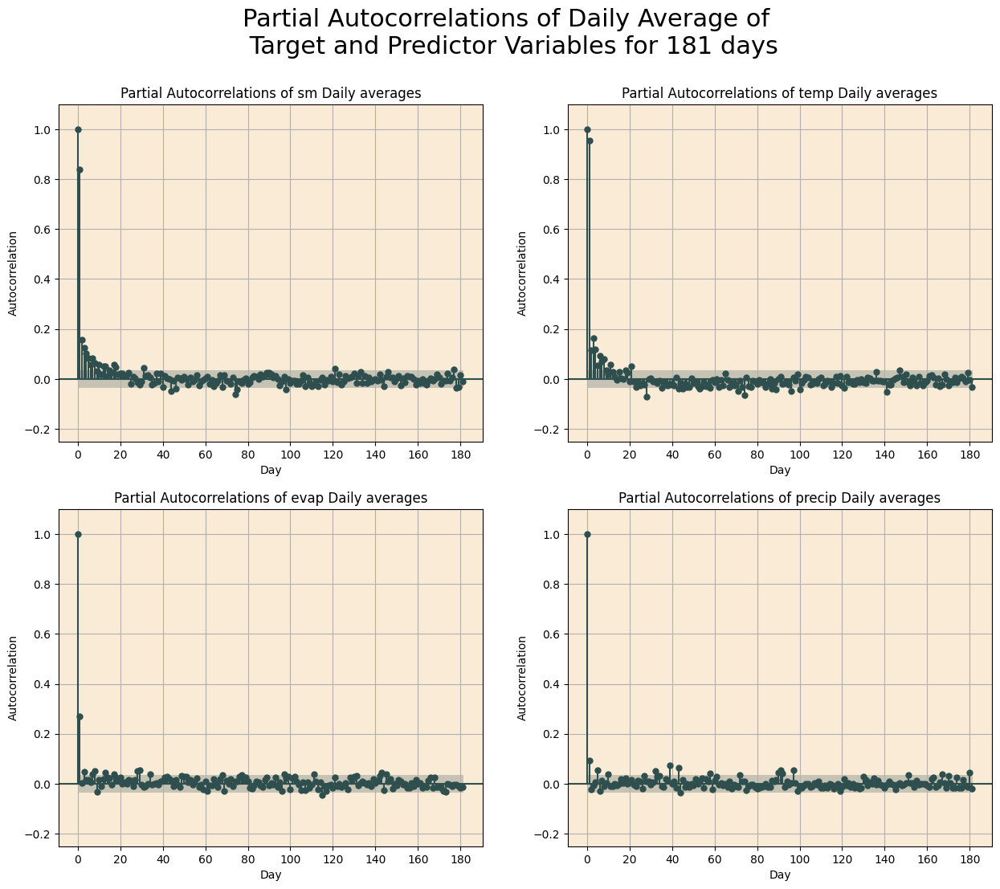

In [ ]:
# https://stackoverflow.com/questions/65870368/how-to-change-color-in-statsmodels-plot-acf-function
# https://stats.stackexchange.com/questions/305686/what-does-it-mean-if-the-partial-auto-correlation-function-of-a-time-series-have

lags = 181 #number of days to observe
curr_fig, axs = plt.subplots(2,2,figsize=(15, 12))
axs = axs.flat

plt.suptitle('Partial Autocorrelations of Daily Average of \n Target and Predictor Variables for 181 days', fontsize = 22)

for var,ax in zip(vars, axs):

    plot_pacf(avgs[var], lags=lags, title= f"Partial Autocorrelations of {var} Daily averages", auto_ylims=True, ax=ax)

    my_color="darkslategrey"

    for item in ax.collections:
      #change the color of the CI 
      if type(item)==PolyCollection:
            item.set_facecolor(my_color)
      #change the color of the vertical lines
      if type(item)==LineCollection:
            item.set_color(my_color)    

    #change the color of the markers/horizontal line
    for item in ax.lines:
        item.set_color(my_color)

    ax.set_facecolor('antiquewhite')
    #curr_ax.grid(color='darkslategrey', alpha=0.5, linestyle='dashed', linewidth=1)
    ax.grid()
    ax.set_ylim(-0.25,1.1)
    ax.set_xticks(np.arange(lags, step=20))
    ax.set_xlabel('Day')
    ax.set_ylabel('Autocorrelation');

## Validation of Selected Variables

#### Correlation plot

Since we intend to use evapotranspiration, surface temperature and precipitation as predictors for soil moisture, we found it important to provide a correlation matrix of these variables. This does not ensure that the predictors will be relevant but this is a common quick check to see if the variables change together or not.

Since our time series are matrices over time, we computed the average of each matrix to get univariate time series and easily obtain the correlation between these series. By doing so, we do not care yet about the spatial component. 

We can see that the average soil moisture is 
* Highly negatively correlated with the average surface temperature (-0.80)
* Positively correlated with the average precipitation (0.30)
* Slightly positively correlated with the average evapotranspiration (0.14)


In [ ]:
# https://stackoverflow.com/questions/29432629/plot-correlation-matrix-using-pandas

# Compute pairwise correlation among our variables
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')
# Fill diagonal and upper half with NaNs
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
(corr
 .style.set_caption("Correlation Matrix of the features' daily averages").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'tomato'),
        ('font-size', '20px')
    ]
}])
 .background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1)
 .highlight_null(color='#f1f1f1')  # Color NaNs grey
 .format(precision=2))

,avg_sm,avg_temp,avg_evap,avg_precip
avg_sm,nan,nan,nan,nan
avg_temp,-0.47,nan,nan,nan
avg_evap,0.28,0.01,nan,nan
avg_precip,0.38,0.07,0.33,nan


We observed that all our predictors seem relevant (especially surface temperature, and even if the correlation with evapotranspiration is a bit lower it might still be relevant). Let us also note that the predictors are not too correlated with each other (at most 0.30), which means that they are not redundant and could be varied enough to bring unique information to predict soil moisture.

#### Predictors Relevance Statistical Tests

Lastly, we wanted to provide further information to measure the relevance of our predictor variables. We have already shown that our predictors may be relevant according to the analysis of the covariances between our variables. However, correlation does not mean that our variables will be able to predict soil moisture. Thus, we decided to provide a stronger property through a statistical test specific to time series data. 

We used the Granger causality test, which is a statistical hypothesis test used to determine whether one time series is useful in forecasting another time series. It tests whether the past values of one time series help in predicting the future values of another time series.

The null hypothesis of the Granger causality test is that the past values of one time series do not help in predicting the future values of the other time series, after taking into account the past values of both time series. If the p-value of the test is less than a chosen significance level (typically 0.05), we reject the null hypothesis and conclude that there is evidence of Granger causality from the first time series to the second time series.

If the p-value is greater than the chosen significance level, we fail to reject the null hypothesis and conclude that there is no evidence of Granger causality from the first time series to the second time series. However, it is important to note that the Granger causality test does not prove causality, it only provides evidence for or against it.

Let us see if our predictors Granger-cause soil moisture:

In [ ]:
# https://www.kaggle.com/code/prashant111/complete-guide-on-time-series-analysis-in-python
from statsmodels.tsa.stattools import grangercausalitytests

In [ ]:
maxlag = 10

In [ ]:
# https://www.machinelearningplus.com/time-series/granger-causality-test-in-python/
def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

In [ ]:
result = grangers_causation_matrix(df, variables = df.columns) 
result.style.set_caption("Granger Causation Matrix of the features' daily averages").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'tomato'),
        ('font-size', '15px')
    ]
}])

,avg_sm_x,avg_temp_x,avg_evap_x,avg_precip_x
avg_sm_y,1.000000,0.000000,0.000100,0.000000
avg_temp_y,0.000000,1.000000,0.000000,0.000000
avg_evap_y,0.005200,0.000100,1.000000,0.201400
avg_precip_y,0.392100,0.003400,0.000000,1.000000


The p-values of our tests are reported in the dataframe, in which we test if variable_x Granger-causes variable_y. Here, we can focus on the first line of the Granger causation matrix. We can see that the p-values for the tests that our each of our predictors (surface temperature, evapotranspiration and precipitation) Granger-cause soil moisture are very low (below 5%), meaning that we can reject the null hypothesis “x does not Granger-cause y”. Thus, this corroborates the fact that the predictors chosen will be relevant to forecast soil moisture. 

The EDA conducted on the spatiotemporal data of soil moisture, surface temperature, evapotranspiration, and precipitation provided our team with valuable insights into the patterns and trends of these variables over time and across regions in Spain. By analyzing the temporal and spatial variations in these variables, we were able to identify the flow of our data, and understand the relationships between our variables.

# DATA PROCESSING


## Model Masking

We started by adding a mask layer to our model. The code below creates a binary mask for an image by copying an image array from the dictionary of geospatial data files, and then assigning a value of 0 to all non-NaN elements in the copied array and a value of 1 to all NaN elements. In other words, the resulting mask has a value of 0 for all valid (non-NaN) pixels in the original image, and a value of 1 for all invalid (NaN) pixels in the original image. This mask can then be used to perform operations or calculations only on valid pixels in the original image, such as filtering or masking out invalid data. This is required because the ocean and seas have NaN values and the land has water.

In [ ]:
# Getting rid of file names in the dictionary to make analysis easier, but geo_files that has the names is still important. So we are keeping.
geo_files_no_names = {key: np.array([value[0] for value in geo_files[key]]) for key in geo_files.keys()}

In [ ]:
mask_image = geo_files_no_names['sm'][2].copy()
mask_image[~np.isnan(mask_image)] = 0
mask_image[np.isnan(mask_image)] = 1

In [ ]:
# View
geo_files_no_names['sm'][1]

array([[0.1239637 , 0.1239637 , 0.12063728, ..., 0.24908577, 0.24908577,
        0.24908577],
       [0.1239637 , 0.1239637 , 0.12063728, ..., 0.24908577, 0.24908577,
        0.24908577],
       [0.1239637 , 0.1239637 , 0.12063728, ..., 0.24908577, 0.24908577,
        0.24908577],
       ...,
       [0.15326057, 0.15326057, 0.1729139 , ...,        nan,        nan,
               nan],
       [0.15326057, 0.15326057, 0.1729139 , ...,        nan,        nan,
               nan],
       [0.15326057, 0.15326057, 0.1729139 , ...,        nan,        nan,
               nan]], dtype=float32)

In [ ]:
for cmap in cm.datad:
    if cmap.startswith('Gn') and cmap.endswith('Bu'):
        print(cmap)

GnBu


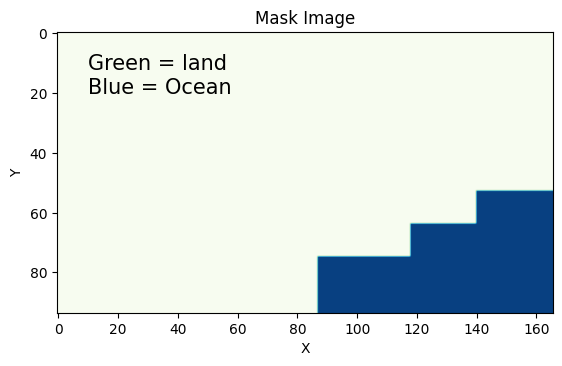

In [ ]:
plt.imshow(mask_image, cmap='GnBu', vmin=0, vmax=1)
plt.text(10, 20, "Beige = land\nBlue = Ocean", fontsize=15)

plt.title('Mask Image')
plt.xlabel('X')
plt.ylabel('Y')

plt.show()

## Normalizing


In data analysis and machine learning, it is often necessary to normalize data to ensure that different variables have equal importance when making predictions or performing calculations. Normalization is a process that rescales variables to a common scale, which is typically between 0 and 1, so that each variable contributes equally to the analysis.

Our data contains variables measured in Kelvin, which is a unit of temperature, but our other variables have different measures of lower magnitudes. The large differences in magnitude would cause issues with our model. To address this issue, the data was normalized using a MinMax Scalar. This method scales each variable to a range between 0 and 1 based on the minimum and maximum values in the dataset.

In [ ]:
# Scaling with NaNs still
scaler = MinMaxScaler()

geo_files_scaled = {}

# Loop through the keys in the geo_files dictionary
for key in geo_files_no_names:
    scaled_images_list = []  # create a list to hold the scaled images for each day
    for i in range(0, length):
        # Get the current array of images
        images = geo_files_no_names[key][i]

        # Get the shape of the images array
        original_shape = images.shape

        # Reshape the images array to 2D for applying the scaler
        images_2d = images.reshape(-1, original_shape[-1])

        # Fit the scaler on the 2D images array and transform it
        scaled_images_2d = scaler.fit_transform(images_2d)

        # Reshape the scaled images back to their original shape
        scaled_images = scaled_images_2d.reshape(original_shape)

        # Append the scaled images to the list
        scaled_images_list.append(scaled_images)

    # Update the images in the geo_files_scaled dictionary with the list of scaled images
    geo_files_scaled[key] = np.array(scaled_images_list)

In [ ]:
# Compare not scaled versus scaled. Make sure they are different.
display(geo_files_no_names['temp'][1], geo_files_scaled['temp'][1])

array([[274.93655, 274.93655, 274.9424 , ..., 279.19608, 279.19608,
        279.19608],
       [274.93655, 274.93655, 274.9424 , ..., 279.19608, 279.19608,
        279.19608],
       [274.93655, 274.93655, 274.9424 , ..., 279.19608, 279.19608,
        279.19608],
       ...,
       [275.626  , 275.626  , 275.6182 , ...,       nan,       nan,
              nan],
       [275.626  , 275.626  , 275.6182 , ...,       nan,       nan,
              nan],
       [275.626  , 275.626  , 275.6182 , ...,       nan,       nan,
              nan]], dtype=float32)

array([[0.5673981, 0.5673981, 0.6185303, ..., 0.       , 0.       ,
        0.       ],
       [0.5673981, 0.5673981, 0.6185303, ..., 0.       , 0.       ,
        0.       ],
       [0.5673981, 0.5673981, 0.6185303, ..., 0.       , 0.       ,
        0.       ],
       ...,
       [1.       , 1.       , 1.       , ...,       nan,       nan,
              nan],
       [1.       , 1.       , 1.       , ...,       nan,       nan,
              nan],
       [1.       , 1.       , 1.       , ...,       nan,       nan,
              nan]], dtype=float32)

In [ ]:
# Creating averages into a dictionary for scaled values
scaled_vars = ['sm','temp','evap','precip']
scaled_avgs = {var: [] for var in scaled_vars}

In [ ]:
for var in scaled_vars:
    for i in range(length):
        scaled_avgs[var].append(np.nanmean(geo_files_scaled[var][i]))

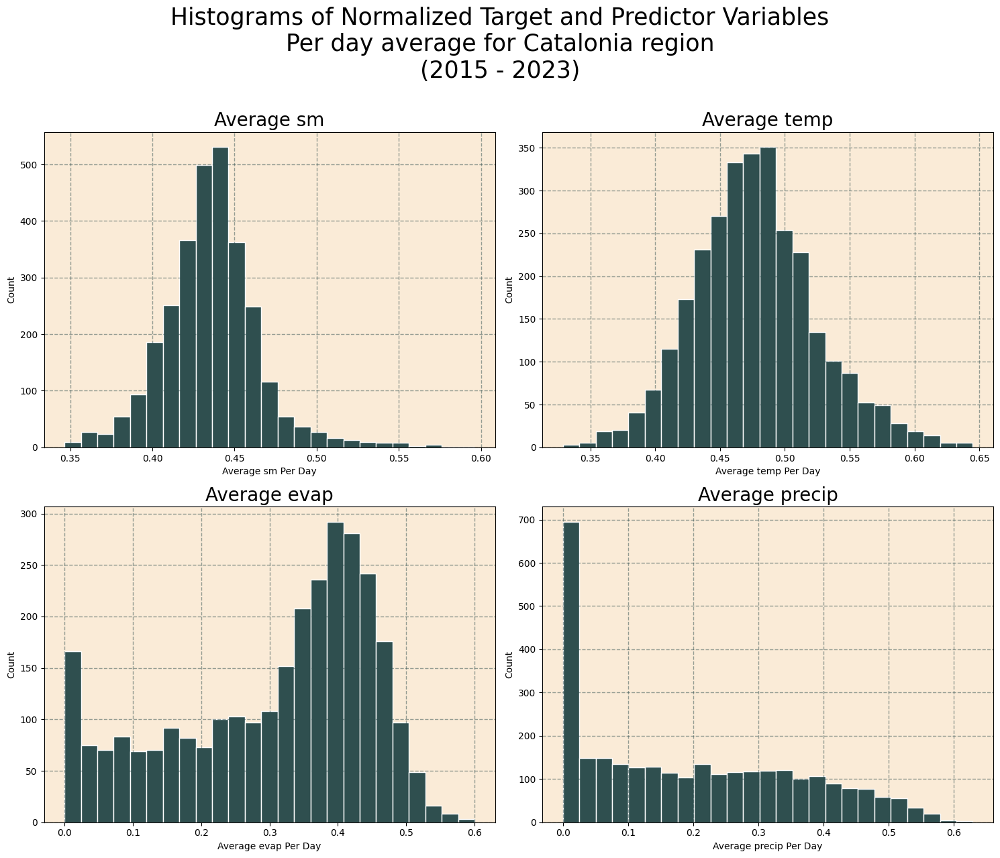

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 13))
axs = axs.flat

plt.suptitle('Histograms of Normalized Target and Predictor Variables\nPer day average for Catalonia region\n(2015 - 2023)\n', fontsize = '25')

for var, ax in zip(scaled_vars, axs):
    ax.set_facecolor('antiquewhite')
    ax.grid(color='darkslategrey', alpha=0.5, linestyle='dashed', linewidth=1)
    ax.hist(scaled_avgs[var], color='darkslategrey', bins = 25, edgecolor = 'white')
    ax.set_title(f'Average {var}', fontsize= '20')
    ax.set_xlabel(f'Average {var} Per Day')
    ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

## Data Cleaning

Next we replaced all nan values which represent the ocea with zeros. Later on when we add the mask layer will ensure that those values do not affect the performance of our model.

In [ ]:
# Take all values in the dictionary for all keys, and replace nan with zero and keep scaled values the same
for key, value in geo_files_scaled.items():
     geo_files_scaled[key] = np.where(np.isnan(value), 0, value)

In [ ]:
geo_files_norm_nonanz = geo_files_scaled.copy()

In [ ]:
# Double checking for NaN values in the geo_files dictionary. Can't run it through the model if so.
nan_count = 0

for key in geo_files_norm_nonanz:
    for array in geo_files_norm_nonanz[key]:
        nan_count += np.isnan(array).sum()
print("Number of NaN values remaining in geo_files_norm_nonanz:", nan_count)

Number of NaN values remaining in geo_files_norm_nonanz: 0


In [ ]:
# Check
geo_files_norm_nonanz['sm'][1]

array([[0.        , 0.        , 0.        , ..., 1.        , 1.        ,
        1.        ],
       [0.        , 0.        , 0.        , ..., 1.        , 1.        ,
        1.        ],
       [0.        , 0.        , 0.        , ..., 1.        , 1.        ,
        1.        ],
       ...,
       [0.28318584, 0.28318584, 0.48403502, ..., 0.        , 0.        ,
        0.        ],
       [0.28318584, 0.28318584, 0.48403502, ..., 0.        , 0.        ,
        0.        ],
       [0.28318584, 0.28318584, 0.48403502, ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

After preparing our data appropriately, we proceeded to reshape our datasets to generate the covariates required for subsequent modeling. The resulting intermediate output is a multidimensional array of dimensions (2948, 94, 166, 4), wherein each dimension represents a significant aspect of our data. Specifically, this array comprises 2948 daily images with a spatial resolution of 94 by 166 pixels, each associated with four predictors, namely the Mask, Temperature, Precipitation, and Evapotranspiration.

The same processing steps were conducted for our response variable: soil moisture, producing a shape of (2948,94,166).

In [ ]:
# Now we have our final processed dictionary
final_geo_files =  geo_files_norm_nonanz.copy()

In [ ]:
# Creating our X data set
temp_arrays = final_geo_files['temp']
evap_arrays = final_geo_files['evap']
precip_arrays = final_geo_files['precip']

# stacking the temperature, evaporation, and precipitation arrays and check shape
stacked_arrays = np.stack([temp_arrays, evap_arrays, precip_arrays], axis=-1)
print(f'Stacked array of covariates with shapes: {stacked_arrays.shape}')

# create 'length' copies of the mask image. Not very efficient, will improve in pipeline for our full data set. 
num_arrays = stacked_arrays.shape[0]

# create array with shape (length, 94, 166) by broadcasting mask_image
expanded_mask_image = np.broadcast_to(mask_image, (num_arrays,) + mask_image.shape)

# add new axis with shape (length, 94, 166, 1)
expanded_mask_image = np.expand_dims(expanded_mask_image, axis=-1)
print(f'expanded mask shape: {expanded_mask_image.shape}')

X = np.concatenate([stacked_arrays, expanded_mask_image], axis=-1)

print(f'Final input X shape:{X.shape}')
print('\nHorray! We have inputs.\n')

Stacked array of covariates with shapes: (2948, 94, 166, 3)
expanded mask shape: (2948, 94, 166, 1)
Final input X shape:(2948, 94, 166, 4)

Horray! We have inputs.



In [ ]:
# Creating our y data set
y = final_geo_files['sm']

print('y_shape', y.shape)
print('\nHorray! We have outputs to validate against.\n')

y_shape (2948, 94, 166)

Horray! We have outputs to validate against.



## Train Val Test Splits

Subsequent to our data preparation, we divided our data into training, validation, and testing subsets, consisting of 80%, 10%, and 10% of the total observations, respectively. The resulting subsets were of appropriate size to facilitate robust training, validation, and evaluation of the predictive model's performance.

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False, stratify=None)

X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, test_size=0.5, random_state=42, shuffle=False, stratify=None)

# Print the shape of the training and validation sets
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}\n")
print(f"X_val shape: {X_val.shape}")
print(f"y_val shape: {y_val.shape}\n")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (2358, 94, 166, 4)
y_train shape: (2358, 94, 166)

X_val shape: (295, 94, 166, 4)
y_val shape: (295, 94, 166)

X_test shape: (295, 94, 166, 4)
y_test shape: (295, 94, 166)


## Time Series Sequence Generator for Conv2dLSTM Model

Before proceeding with the training of our baseline model, we performed one final preprocessing step. The baseline model objective was to utilize seven days of input data to predict the subsequent day's soil moisture levels. To achieve this, we transformed our tensor data into sequences by applying a sliding window approach with a stride of one and a window size of seven. This process enabled us to create input-output pairs for our model, facilitating the prediction of future soil moisture values based on past values.

To generate the sequences, we employed the TimeseriesGenerator module from the Keras library. This module provided an efficient and straightforward means of generating batches of input-output sequences from our tensor data

Important note: according to the TimeseriesGenerator webpage: tf.keras.preprocessing.sequence.TimeseriesGenerator does not operate on tensors and is not recommended for new code. However, we found that it works for our tensor dataset and chose to keep it for this model: (https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/sequence/TimeseriesGenerator)

In [ ]:
train_generator = TimeseriesGenerator(X_train, y_train, length=7, batch_size=32, shuffle=False, reverse=False)
val_generator = TimeseriesGenerator(X_val, y_val, length=7, batch_size=32, shuffle=False, reverse=False)
test_generator = TimeseriesGenerator(X_test, y_test, length=7, batch_size=32, shuffle=False, reverse=False)

In [ ]:
# Checking outputs
print(f'Does the first element of the batch output values in the train_gen equal the first element in the batch values of y_train? \n\n{np.all(train_generator.__getitem__(0)[1][0:1] == y_train[7])}\n')

Does the first element of the batch output values in the train_gen equal the first element in the batch values of y_train? 

[[[ True  True  True ...  True  True  True]
  [ True  True  True ...  True  True  True]
  [ True  True  True ...  True  True  True]
  ...
  [ True  True  True ...  True  True  True]
  [ True  True  True ...  True  True  True]
  [ True  True  True ...  True  True  True]]]



In [ ]:
print(f'Does the first sliding window work? \n\n{np.all(train_generator.__getitem__(0)[0][0][3] == X_train[0:7][3])}\n')

Does the first sliding window work? 

[[[ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]
  ...
  [ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]]

 [[ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]
  ...
  [ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]]

 [[ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]
  ...
  [ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]]

 ...

 [[ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]
  ...
  [ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]]

 [[ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]
  ...
  [ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True  True]]

 [[ True  True  True  True]
  [ True  True  True  True]
  [ True  True  True

# MODELING SOIL MOISTURE

## Baseline Model: ConvLSTM2D

Our baseline model architecture will involve a ConvLSTM2D layer followed by a fully connected layer for prediction. 

It is suitable for predicting future soil moisture because it takes into account the temporal dependencies in the data by using a recurrent neural network (LSTM) with a `return_sequences=True` argument. This allows the model to output a sequence of predictions, one for each input timestep.

The model begins with a 2D convolutional layer, which extracts features from the input data. The output of this layer is then reshaped into a 3D tensor, which serves as the input to the LSTM layer. The LSTM layer then processes the sequence of features and produces an output sequence of the same length. Finally, a dense layer is applied to each output timestep to produce a single predicted value.
By taking into account the temporal dependencies in the data and allowing for variable-length input sequences, this model can effectively capture the patterns and trends in the data and make accurate predictions.


### Model Architecture

In [ ]:
baseline_model = tf.keras.models.Sequential(name="baseline_model", layers=[
    ConvLSTM2D(filters=1, kernel_size=(3, 3), padding='same', activation='relu', return_sequences=True,
               input_shape=(7, 94, 166, 4), name="conv_lstm"),
    Flatten(name="flatten"),
    Dense(15604, activation='sigmoid', name="dense"),
    Reshape((94, 166), name="reshape")])


In [ ]:
baseline_model.summary()

Model: "baseline_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm (ConvLSTM2D)      (None, 7, 94, 166, 1)     184       
                                                                 
 flatten (Flatten)           (None, 109228)            0         
                                                                 
 dense (Dense)               (None, 15604)             1704409316
                                                                 
 reshape (Reshape)           (None, 94, 166)           0         
                                                                 
Total params: 1,704,409,500
Trainable params: 1,704,409,500
Non-trainable params: 0
_________________________________________________________________


__*Citation for Visualizations:*__<br>
@misc{Gavrikov2020VisualKeras,<br>
  author = {Gavrikov, Paul},<br>
  title = {visualkeras},<br>
  year = {2020},<br>
  publisher = {GitHub},<br>
  journal = {GitHub repository},<br>
  howpublished = {\url{https://github.com/paulgavrikov/visualkeras}},

In [ ]:
color_map = defaultdict(dict)
color_map[ConvLSTM2D]['fill'] = 'tomato'
color_map[Flatten]['fill'] = 'darkslategrey'
color_map[Dense]['fill'] = 'antiquewhite'
color_map[Reshape]['fill'] = 'cadetblue'

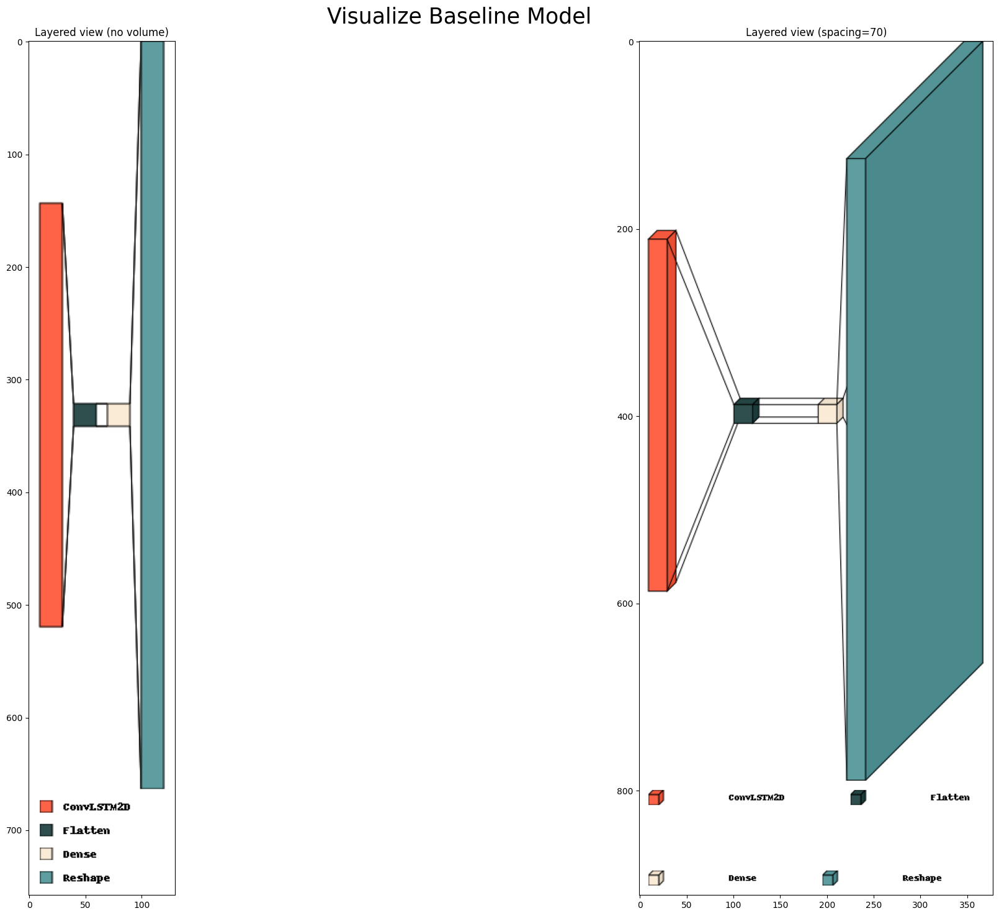

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(30, 15))
fig.suptitle('Visualize Baseline Model', fontsize=25)
axs[0].imshow(visualkeras.layered_view(baseline_model, color_map=color_map, legend=True, draw_volume=False))
axs[0].set_title('Layered view (no volume)')
axs[1].imshow(visualkeras.layered_view(baseline_model, color_map=color_map, legend=True, spacing=70))
axs[1].set_title('Layered view (spacing=70)')
plt.tight_layout()
plt.show()

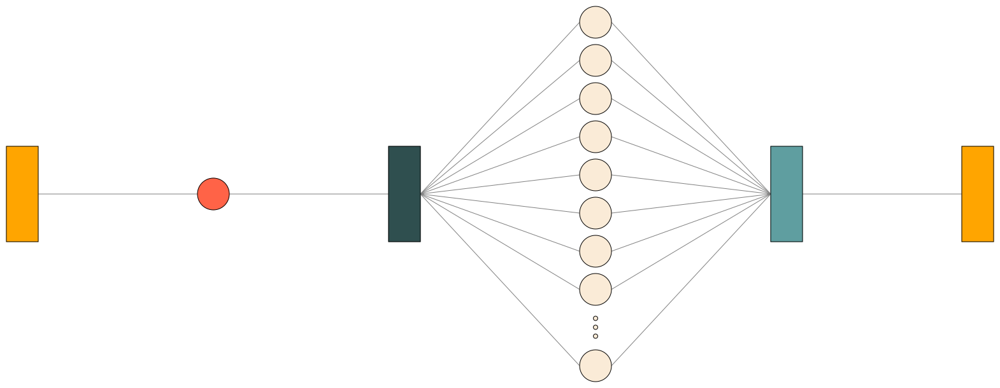

In [ ]:
visualkeras.graph_view(baseline_model, color_map=color_map)

### Training and Validation

In [ ]:
# Compile
baseline_model.compile(optimizer='adam', loss='mse' , metrics = ["mean_absolute_error"])

In [ ]:
# Train the model
baseline_history = baseline_model.fit(train_generator, epochs=3,validation_data=val_generator)

Epoch 1/3
74/74 [==============================] - 759s 10s/step - loss: 0.0704 - mean_absolute_error: 0.1700 - val_loss: 0.0414 - val_mean_absolute_error: 0.1574
Epoch 2/3
74/74 [==============================] - 643s 9s/step - loss: 0.0286 - mean_absolute_error: 0.1168 - val_loss: 0.0225 - val_mean_absolute_error: 0.0946
Epoch 3/3
74/74 [==============================] - 641s 9s/step - loss: 0.0233 - mean_absolute_error: 0.0993 - val_loss: 0.0206 - val_mean_absolute_error: 0.0948


Saving weights for later use. 

In [ ]:
baseline_model.save_weights('final_baseline_model_weights.h5')

Reloaded saved weights

In [ ]:
baseline_model.load_weights('final_baseline_model_weights.h5')

In [ ]:
train_loss = baseline_history.history['loss']
val_loss = baseline_history.history['val_loss']

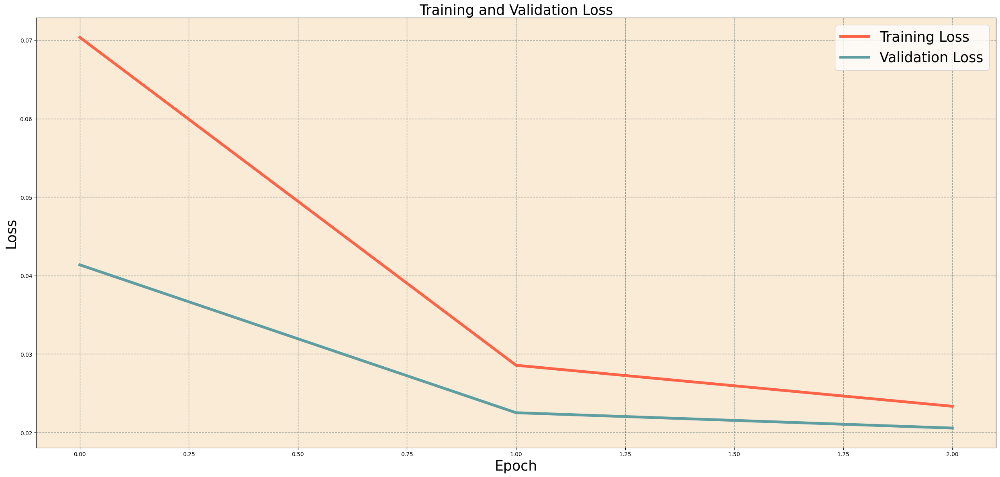

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(25, 12))

axes.plot(train_loss, label='Training Loss', color='tomato', lw=5)
axes.plot(val_loss, label='Validation Loss', color='cadetblue', lw=5)
axes.set_title('Training and Validation Loss', fontsize =25)
axes.set_xlabel('Epoch', fontsize = 25)
axes.set_ylabel('Loss', fontsize = 25)
axes.legend(fontsize = 25)
axes.set_facecolor('antiquewhite')
axes.grid(color='darkslategrey', alpha=0.5, linestyle='dashed', linewidth=1)

plt.tight_layout()
plt.show()

### Testing and Inference

Testing on the first batch pair of the test_generator.

In [ ]:
x, y_true = train_generator.__getitem__(0)[0], train_generator.__getitem__(0)[1]
y_pred = baseline_model.predict(x)

print("Predicted output shape:", y_pred.shape)
print("True output shape:", y_true.shape)

1/1 [==============================] - 0s 369ms/step
Predicted output shape: (32, 94, 166)
True output shape: (32, 94, 166)


In [ ]:
print("Predicted output for the first timestep of the first image for the first row of the image:", y_pred[0][0].shape,'\n', y_pred[0][0],'\n')
print("True output for the first timestep of the first image for the first row of the image:", y_true[0][0].shape,'\n', y_true[0][0])

Predicted output for the first timestep of the first image for the first row of the image: (166,) 
 [0.43174776 0.43371597 0.37880108 0.3921204  0.3792868  0.35606313
 0.3895012  0.3512024  0.36564752 0.42018393 0.38248557 0.4109157
 0.38491726 0.08336715 0.08172185 0.08277551 0.08273586 0.0819254
 0.08313368 0.08416048 0.08232009 0.08263963 0.08215776 0.03981357
 0.04671381 0.0377421  0.0401329  0.03535682 0.04000517 0.04449658
 0.03634188 0.041604   0.04628818 0.04920191 0.13021268 0.1280004
 0.12600632 0.130429   0.12760818 0.13192263 0.1256571  0.12615018
 0.13993147 0.12050376 0.2485692  0.2662962  0.26390874 0.26158285
 0.25927594 0.25402796 0.26165688 0.26980844 0.25374958 0.28352743
 0.2513564  0.11741272 0.11617239 0.11494923 0.11387689 0.11729679
 0.11305906 0.11325094 0.11704862 0.11854928 0.11375082 0.11401743
 0.1557521  0.15497349 0.15675251 0.15429446 0.16522066 0.1605094
 0.1548439  0.15514576 0.15855148 0.15496041 0.04141068 0.04140998
 0.05571824 0.0412335  0.04103522

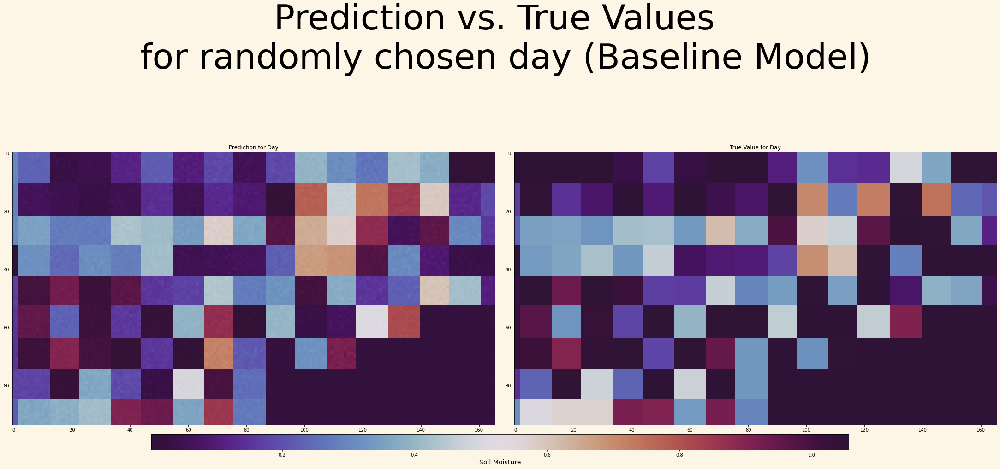

In [ ]:
# Define the figure and axes
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(30, 15), constrained_layout=True)
fig.set_facecolor("oldlace")

# Loop over each time step and plot the predictions and true value for that time step

im1 = axs[0].imshow(
    y_pred[0], cmap="twilight_shifted"
)
# axs[0].set_title(f"Prediction for Day {t+1}")
axs[0].set_title(f"Prediction for Day")


    # Plot the true value
im2 = axs[1].imshow(
    y_true[0], cmap="twilight_shifted"
)
# axs[1].set_title(f"True Value for Day {t+1}")
axs[1].set_title(f"True Value for Day")


# Create a new axis for the colorbar
cax = fig.add_axes([0.15, 0.1, 0.7, 0.03])
cbar = fig.colorbar(im1, cax=cax, orientation="horizontal")
cbar.set_label("Soil Moisture", fontsize=14)

# Add a common title to the figure
fig.suptitle("Prediction vs. True Values \n for randomly chosen day (Baseline Model)", fontsize=75)

# Show the figure
plt.show()

In [ ]:
test_loss, _ = baseline_model.evaluate_generator(test_generator)
print('Test loss:', test_loss)

Test loss: 0.024630531668663025


Interpret Results

Our impression of the results of the baseline model is as follows:

- The way training loss decreases over epochs is good in that our model improves with more epochs.
- But the validation loss doesn't decrease very much over increasing epochs.
- We added an accuracy metric of MAPE, which stands for Mean Absolute Percentage Error. Our TF recommended it as it is a commonly used to evaluate the performance of forecasting models. It measures the average difference between the predicted values and the actual values, expressed as a percentage of the actual values.
- Our last val MAPE from epoch 3 is 0.0948. This means that on average, the model's predictions are off by 9.48% from the true values.
- This isn't the best and we hope that our next model will have a smaller MAPE. 

## VIT Model: Vision Transformers

In terms of modelling, we believe that using visual transformers is the best option. The main reason why we are shifting away from ConvLSTMs is because of scalability concerns: Transformers can efficiently process long sequences and large input sizes due to their self-attention mechanism, which allows them to model dependencies across the entire input sequence in parallel. ConvLSTMs, on the other hand, process the input data sequentially, which can limit their ability to scale to large input sizes and capture long-range dependencies. The second reason is because of overall performance: visual transformers have achieved SOTA performance on a wide range of computer vision tasks, outperforming traditional convolutional neural networks (CNNs) and similar architectures. The self-attention mechanism in transformers allows them to learn complex patterns and representations, leading to improved performance on tasks.

Our Vision Transformer works as follows:

1. First, we "tokenize" the images: we divide the input images into fixed-size patches to reduce the complexity of the attention mechanism. We found the following very instructive to understand the motivation of using patches in visual transformers: "the unit representation of an image is pixels and there are too many pixels in an image when we compared to the number of words in a sentence. The core of the attention model is the classic matrix multiplication of Query(Q) and the Key(K) is a quadratic operation. An image having 224x224x3 => width x height x channels dimension will result in occupying trillions of bytes in the memory for a small dataset - which is primarily not possible even for modern-day hardware". https://gowrishankar.info/blog/transformers-everywhere-patch-encoding-technique-for-vision-transformersvit-explained/

2. We then flattened the patches and added positional encodings to help the model to retain the positional information of the patches in the image. We also added temporal encodings to the images within each sequence of days to retain the temporal information of our input data. 

3. We then passed the information through the transformer encoder where the attention mechanism is used.

4. Finally, we added a prediction head to the transformer model. This will be a dense layer with a softmax activation to bound our predictions between 0 and 1 (soil moisture range). We then reshape the output to get the desired predictions.

### Time Series Sequence Generator for Vit Model

Similarly to our previous Conv2dLSTM model, we needed to reshape our data to generate input and output sequences of 28 and 7 days, respectively, for our ViT Model. However, we encountered a limitation in the TimeseriesGenerator module from the Keras library, which is restricted to generating a single day of output.

To overcome this limitation, we devised a custom implementation of the TimeseriesGenerator module, enabling us to produce output sequences of seven days. Our approach involved setting the sliding window and stride as hyperparameters, which enabled us to tailor the sequence generation process to our need.

In [ ]:
x_window = 28
y_window = 7
WINDOW_SIZE = x_window + y_window  # Number of days to use for each prediction, X,y
STEP_SIZE = 1  # Number of days between each prediction
new_height = 80
new_width = 160

features = ["sm", "temp", "evap", "precip"]
window_inputs = []
window_outputs = []

for i in tqdm(range(len(final_geo_files["sm"]) - WINDOW_SIZE + 1)):
    arrays = [
        final_geo_files[name][i : i + x_window, :new_height, :new_width] for name in features
    ]
    inputs = torch.from_numpy(np.stack(arrays, axis=1))
    outputs = torch.from_numpy(
        final_geo_files["sm"][i + x_window : i + x_window + y_window, :new_height, :new_width]
    )
    outputs = torch.unsqueeze(outputs, 0)
    window_inputs.append(inputs)
    window_outputs.append(outputs)


100%|██████████| 2914/2914 [00:06<00:00, 477.81it/s]


### Model Architecture 

In [ ]:
# Adding number of timesteps
# Define the training parameters
batch_size = 1
learning_rate = 1e-3
num_epochs = 10

in_channels  =  4
num_timesteps = batch_size*window_inputs[0].shape[0]


# Define the model architecture
class VisualTransformer(nn.Module):
    def __init__(
        self,
        image_width=new_width,
        image_height=new_height,
        patch_size=20,
        hidden_size=256,
        num_layers=2,
        num_heads=8,
        dropout=0,
        num_timesteps=num_timesteps,
    ):
        super().__init__()
        self.patch_size = patch_size
        self.image_width = image_width
        self.image_height = image_height
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.num_heads = num_heads
        self.dropout = dropout
        self.num_timesteps = num_timesteps

        # Compute the number of patches per dimension
        self.num_patches_width = image_width // patch_size
        self.num_patches_height = image_height // patch_size
        self.num_patches = self.num_patches_width * self.num_patches_height

        # Define the patch embedding layer
        self.patch_embed = nn.Conv2d(
            in_channels=in_channels,
            out_channels=hidden_size,
            kernel_size=self.patch_size,
            stride=self.patch_size,
        )

        # Define the positional encoding layer for spatial and temporal information
        self.pos_embed = nn.Parameter(
            torch.randn(self.num_timesteps, self.num_patches, hidden_size)
        )

        # Define the transformer encoder layers
        self.transformer_layers = nn.ModuleList(
            [
                nn.TransformerEncoderLayer(
                    d_model=hidden_size, nhead=num_heads, dropout=dropout
                )
                for _ in range(num_layers)
            ]
        )

        # Define the final classification layer
        # self.classifier = nn.Linear(
        #     self.hidden_size,
        #     batch_size * y_window * self.image_width * self.image_height,
        # )
        self.classifier = nn.Sequential(nn.Linear(
            self.hidden_size, 
            batch_size*y_window*self.image_width*self.image_height), 
            nn.Sigmoid())

    def forward(self, x):
        # Reshape the input tensor to have 4 dimensions
        x = x.view(x.shape[0], x.shape[2], x.shape[1], x.shape[3])
        

        # Apply the patch embedding layer to the input image
        x = self.patch_embed(x)
        

        # Reshape the output of the patch embedding layer to have a sequence length of num_patches
        b, c, h, w = x.shape
        x = x.view(b, c, -1).transpose(1, 2)
        

        # Add the positional encodings to the patches, accounting for both spatial and temporal positions
        x = x + self.pos_embed
        

        # Apply the transformer encoder layers to the patches
        for layer in self.transformer_layers:
            x = layer(x)

        # Compute the mean of the patches as the representation of the entire image
        x = x.mean(dim=1)
        

        # Apply the final classification layer and return the output
        x = self.classifier(x)
        
        x = x.mean(dim=0)
        
        x = x.view(batch_size, y_window, self.image_height, self.image_width)
        
        return x

Model Diagram From Tensorboard

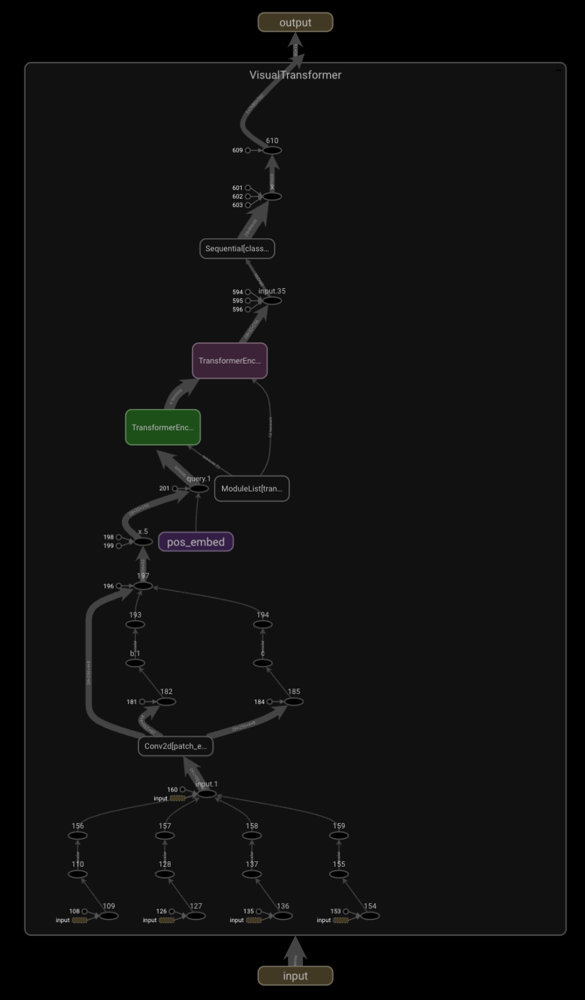

### Train, Validation and Test Splits

In [ ]:
data = list(zip(window_inputs, window_outputs))
train, val_test = train_test_split(data, test_size=0.2, random_state=109)
val, test = train_test_split(val_test, test_size=0.5, random_state=109)

X_train, y_train = zip(*train)
print("X_train shape:", len(X_train))
print("y_train shape:", len(y_train))

X_val, y_val = zip(*val)
print("X_val shape:", len(X_val))
print("y_val shape:", len(y_val))

X_test, y_test = zip(*test)
print("X_test shape:", len(X_test))
print("y_test shape:", len(y_test))

X_train shape: 2331
y_train shape: 2331
X_val shape: 291
y_val shape: 291
X_test shape: 292
y_test shape: 292


In [ ]:
# Create batches and generator to train the Vit Model
train_batched_output_sequence = [torch.cat([y_train[i] for i in range(j,j+batch_size)], 0) for j in range(0, len(y_train)-batch_size+1,batch_size)]
val_batched_output_sequence = [torch.cat([y_val[i] for i in range(j,j+batch_size)], 0) for j in range(0, len(y_val)-batch_size+1,batch_size)]
test_batched_output_sequence = [torch.cat([y_test[i] for i in range(j,j+batch_size)], 0) for j in range(0, len(y_test)-batch_size+1,batch_size)]

In [ ]:
# Concatenate the input and output sequences along the batch dimension for each set

train_data_tensor = torch.cat(X_train, dim=0)
train_data_tensor = torch.reshape(train_data_tensor, (train_data_tensor.shape[0], train_data_tensor.shape[2], train_data_tensor.shape[1], train_data_tensor.shape[3]))
train_mask_tensor = torch.ones_like(train_data_tensor)
train_mask_tensor[train_data_tensor == 0] = 0
train_dataset = TensorDataset(train_data_tensor, train_mask_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size*x_window, shuffle=False)

val_data_tensor = torch.cat(X_val, dim=0)
val_data_tensor = torch.reshape(val_data_tensor, (val_data_tensor.shape[0], val_data_tensor.shape[2], val_data_tensor.shape[1], val_data_tensor.shape[3]))
val_mask_tensor = torch.ones_like(val_data_tensor)
val_mask_tensor[val_data_tensor == 0] = 0
val_dataset = TensorDataset(val_data_tensor, val_mask_tensor)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size*x_window, shuffle=False)

test_data_tensor = torch.cat(X_test, dim=0)
test_data_tensor = torch.reshape(test_data_tensor, (test_data_tensor.shape[0], test_data_tensor.shape[2], test_data_tensor.shape[1], test_data_tensor.shape[3]))
test_mask_tensor = torch.ones_like(test_data_tensor)
test_mask_tensor[test_data_tensor == 0] = 0
test_dataset = TensorDataset(test_data_tensor, test_mask_tensor)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size*x_window, shuffle=False)


### Model Training and Validation

In [ ]:
# Initialize the model and optimizer
model = VisualTransformer().to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Define the loss functions
mse_loss = nn.MSELoss()
mape_loss = nn.L1Loss()

In [ ]:
# Initialize variables for early stopping
best_loss = float('inf')
best_epoch = 0
patience = 5
count = 0

In [ ]:
# Train the model on the training set
for epoch in range(num_epochs):
    running_loss = 0.0
    running_mape = 0.0
    progress_bar = tqdm(train_dataloader, desc=f'Epoch {epoch+1}/{num_epochs}')
    for i, (inputs, mask) in enumerate(progress_bar):
        # Move the inputs and mask to the GPU if available
        inputs = inputs.to(device)
        mask = mask.to(device)
        # Apply the mask to the inputs to handle NaN values
        inputs = torch.where(mask == 0, torch.zeros_like(inputs), inputs)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)

        # Compute the loss
        mse = mse_loss(outputs, train_batched_output_sequence[i])
        mape = mape_loss(outputs, train_batched_output_sequence[i])
        loss = mse

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        running_mape += mape.item() * inputs.size(0)

        # Update the progress bar
        progress_bar.set_postfix({'train_loss': loss.item(), 'train_mape': mape.item()})

    epoch_loss = running_loss / len(train_dataloader.dataset)
    epoch_mape = running_mape / len(train_dataloader.dataset)

    # Evaluate the model on the validation set
    with torch.no_grad():
        val_loss = 0.0
        val_mape = 0.0
        for i, (inputs, mask) in enumerate(val_dataloader):
            # Move the inputs and mask to the GPU if available
            inputs = inputs.to(device)
            mask = mask.to(device)
            # Apply the mask to the inputs to handle NaN values
            inputs = torch.where(mask == 0, torch.zeros_like(inputs), inputs)

            # Forward pass
            outputs = model(inputs)

            # Compute the loss
            mse = mse_loss(outputs, val_batched_output_sequence[i])
            mape = mape_loss(outputs, val_batched_output_sequence[i])
            loss = mse

            val_loss += loss.item() * inputs.size(0)
            val_mape += mape.item() * inputs.size(0)

        val_loss /= len(val_dataloader.dataset)
        val_mape /= len(val_dataloader.dataset)

    print('Epoch [{}/{}], Train Loss: {:.4f}, Train MAPE: {:.4f}, Val Loss: {:.4f}, Val MAPE: {:.4f}'
          .format(epoch+1, num_epochs, epoch_loss, epoch_mape, val_loss, val_mape))

    # Check for early stopping
    if val_loss < best_loss:
        best_loss = val_loss
        best_epoch = epoch
        count = 0
        # Save the model weights
        torch.save(model.state_dict(), 'VIT_v7_elaine_project_idea.pth')
    else:
        count += 1
        if count == patience:
            print(f'Validation loss did not improve for {patience} epochs. Training stopped.')
            break

Epoch 1/10: 100%|██████████| 2331/2331 [04:52<00:00,  7.97it/s, train_loss=0.0139, train_mape=0.0816] 


Epoch [1/10], Train Loss: 0.0263, Train MAPE: 0.1086, Val Loss: 0.0236, Val MAPE: 0.1028


Epoch 2/10: 100%|██████████| 2331/2331 [04:54<00:00,  7.91it/s, train_loss=0.0138, train_mape=0.0798] 


Epoch [2/10], Train Loss: 0.0255, Train MAPE: 0.1060, Val Loss: 0.0235, Val MAPE: 0.1016


Epoch 3/10: 100%|██████████| 2331/2331 [05:17<00:00,  7.35it/s, train_loss=0.0138, train_mape=0.0794] 


Epoch [3/10], Train Loss: 0.0253, Train MAPE: 0.1055, Val Loss: 0.0236, Val MAPE: 0.1015


Epoch 4/10: 100%|██████████| 2331/2331 [06:30<00:00,  5.97it/s, train_loss=0.0138, train_mape=0.0792] 


Epoch [4/10], Train Loss: 0.0253, Train MAPE: 0.1053, Val Loss: 0.0235, Val MAPE: 0.1013


Epoch 5/10: 100%|██████████| 2331/2331 [07:19<00:00,  5.31it/s, train_loss=0.0138, train_mape=0.0789] 


Epoch [5/10], Train Loss: 0.0252, Train MAPE: 0.1052, Val Loss: 0.0235, Val MAPE: 0.1012


Epoch 6/10: 100%|██████████| 2331/2331 [07:08<00:00,  5.43it/s, train_loss=0.0137, train_mape=0.0785] 


Epoch [6/10], Train Loss: 0.0252, Train MAPE: 0.1051, Val Loss: 0.0235, Val MAPE: 0.1011


Epoch 7/10: 100%|██████████| 2331/2331 [07:13<00:00,  5.37it/s, train_loss=0.0137, train_mape=0.0786] 


Epoch [7/10], Train Loss: 0.0252, Train MAPE: 0.1050, Val Loss: 0.0235, Val MAPE: 0.1011


Epoch 8/10: 100%|██████████| 2331/2331 [07:04<00:00,  5.49it/s, train_loss=0.0137, train_mape=0.0787] 


Epoch [8/10], Train Loss: 0.0252, Train MAPE: 0.1050, Val Loss: 0.0235, Val MAPE: 0.1010


Epoch 9/10: 100%|██████████| 2331/2331 [07:16<00:00,  5.34it/s, train_loss=0.0137, train_mape=0.0785] 


Epoch [9/10], Train Loss: 0.0252, Train MAPE: 0.1050, Val Loss: 0.0235, Val MAPE: 0.1009


Epoch 10/10: 100%|██████████| 2331/2331 [09:33<00:00,  4.06it/s, train_loss=0.0137, train_mape=0.0784] 


Epoch [10/10], Train Loss: 0.0252, Train MAPE: 0.1050, Val Loss: 0.0235, Val MAPE: 0.1010


In [ ]:
# Save the model weights to a file
torch.save(model.state_dict(), 'VIT_v7_elaine_project_idea.pth')

# Set up the GCP storage client
client = storage.Client()

# Get the GCP bucket
bucket = client.get_bucket('smap-satellite-images-reduced')

# Define the destination file name in the bucket
destination_blob_name = 'model_weights/VIT_v7_elaine_project_idea.pth'

# Upload the file to the GCP bucket
blob = bucket.blob(destination_blob_name)
blob.upload_from_filename('VIT_v7_elaine_project_idea.pth')

We trained the ViT model our 10 epoches and we decided to report the MSE and MAPE scores.

MSE measures the average squared difference between the predicted and true values, with lower values indicating better performance. Our results show that the model achieved an average MSE of 0.02 on the validation. Given that the soil moisture values range between 0 and 1, these results indicate that our model is performing well in predicting soil moisture.
 
MAPE measures the average absolute percentage difference between the predicted and true values. Our model obtained an average MAPE of 0.1, meaning that, on average, the predictions deviate from the true values by 10%.

### Testing and Inference

In [ ]:
# Now, test it!
model.eval()  # Set the model to evaluation mode
mse_loss = nn.MSELoss(reduction="mean")
mape_loss = nn.L1Loss(reduction="mean")
total_mse_loss = 0
total_mape_loss = 0

with torch.no_grad(), tqdm(total=len(test_dataloader), desc="Testing") as pbar:
    for i, ((data, mask), true_values) in enumerate(
        zip(test_dataloader, window_outputs)
    ):
        data = data.to(device)
        mask = mask.to(device)
        output = model(data)
        loss_mse = mse_loss(output, true_values)
        loss_mape = mape_loss(output, true_values)
        total_mse_loss += loss_mse.item()
        total_mape_loss += loss_mape.item()
        pbar.update(1)

# Calculate and print the average loss over the test set
avg_mse_loss = total_mse_loss / len(window_outputs)
avg_mape_loss = total_mape_loss / len(window_outputs)
print("Average MSE loss on test set: ", avg_mse_loss)
print("Average MAPE loss on test set: ", avg_mape_loss)


Testing: 100%|██████████| 292/292 [00:16<00:00, 17.64it/s]

Average MSE loss on test set:  0.002251888280312544
Average MAPE loss on test set:  0.009606546537622083


We found that the model performed better on the test set, we suspect it may be due to randomization. We investigated the test results by visualizing one of the sequences and plotted a few individual pixels as well as the average across all 12 thousand pixels per predicited days.

In [ ]:
#predicting on 28 days of data 
test_dataloader_iter = iter(test_dataloader)
first_batch = np.array((next(test_dataloader_iter)), dtype=torch.Tensor)
predictions = model(first_batch[1])
true_value_0 = window_outputs[1]

print(f'First Model prediction output has shape:{predictions.shape} and the prediction is \n\n{predictions}')
print(f'First Model prediction output has shape:{predictions.shape}')

print(f'\n\nFirst True Value has shape: {true_value_0.shape} and is \n\n {true_value_0}')
print(f'\n\nFirst True Value has shape: {true_value_0.shape}')

First Model prediction output has shape:torch.Size([1, 7, 80, 160]) and the prediction is 

tensor([[[[0.3879, 0.3882, 0.3323,  ..., 0.9973, 0.9973, 0.9973],
          [0.3869, 0.3875, 0.3327,  ..., 0.9973, 0.9973, 0.9973],
          [0.3878, 0.3871, 0.3326,  ..., 0.9973, 0.9973, 0.9974],
          ...,
          [0.1997, 0.1993, 0.1697,  ..., 0.0022, 0.0022, 0.0022],
          [0.1991, 0.1998, 0.1704,  ..., 0.0022, 0.0022, 0.0022],
          [0.1991, 0.1986, 0.1702,  ..., 0.0022, 0.0021, 0.0022]],

         [[0.3832, 0.3827, 0.3316,  ..., 0.9974, 0.9974, 0.9974],
          [0.3816, 0.3831, 0.3315,  ..., 0.9974, 0.9974, 0.9974],
          [0.3830, 0.3829, 0.3325,  ..., 0.9974, 0.9974, 0.9974],
          ...,
          [0.1898, 0.1892, 0.1695,  ..., 0.0022, 0.0022, 0.0022],
          [0.1897, 0.1888, 0.1697,  ..., 0.0022, 0.0022, 0.0022],
          [0.1899, 0.1892, 0.1701,  ..., 0.0022, 0.0022, 0.0022]],

         [[0.3866, 0.3860, 0.3417,  ..., 0.9974, 0.9975, 0.9975],
          [0.387

/var/folders/0f/5w7d78d96d71ws806y_27zfm1rqhxm/T/ipykernel_2509/1089316223.py:4: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  first_batch = np.array((next(test_dataloader_iter)), dtype=torch.Tensor)


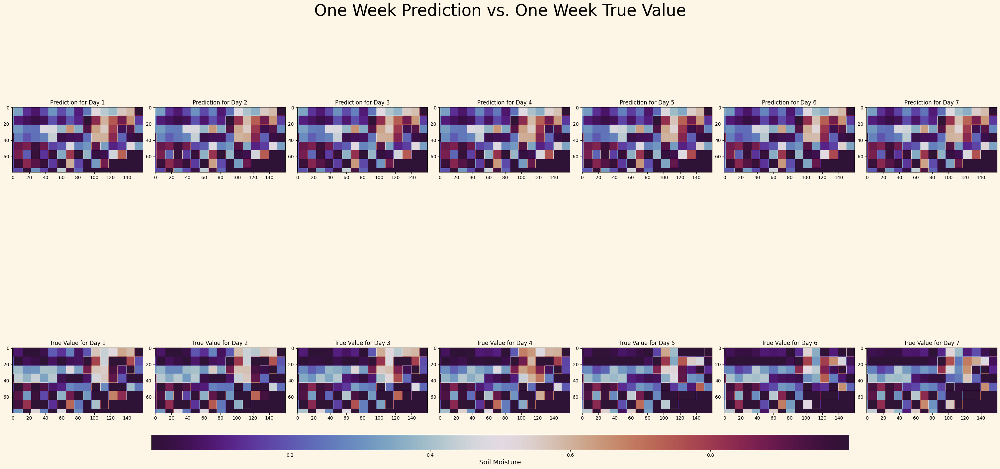

In [ ]:
# Define the figure and axes
fig, axs = plt.subplots(nrows=2, ncols=7, figsize=(30, 15), constrained_layout=True)
fig.set_facecolor("oldlace")

# Loop over each time step and plot the predictions and true value for that time step
for t in range(7):
    # Plot the prediction
    im1 = axs[0, t].imshow(
        predictions[0, t, :, :].detach().numpy(), cmap="twilight_shifted"
    )
    axs[0, t].set_title(f"Prediction for Day {t+1}")

    # Plot the true value
    im2 = axs[1, t].imshow(
        true_value_0[0, t, :, :].detach().numpy(), cmap="twilight_shifted"
    )
    axs[1, t].set_title(f"True Value for Day {t+1}")

# Create a new axis for the colorbar
cax = fig.add_axes([0.15, 0.1, 0.7, 0.03])
cbar = fig.colorbar(im1, cax=cax, orientation="horizontal")
cbar.set_label("Soil Moisture", fontsize=14)

# Add a common title to the figure
fig.suptitle("One Week Prediction vs. One Week True Value", fontsize=35)

# Show the figure
plt.show()

# Save the figure
fig.savefig("prediction_vs_true_value_all_datancov_fast.png")


In [ ]:
previous_days = window_inputs[1].detach().numpy().reshape(4,28,80,160)
previous_days = previous_days[0].reshape(80*160,28)
previous_days.shape

(12800, 28)

In [ ]:
sm_pred = predictions.detach().numpy()[0]
sm_pred = sm_pred.reshape(80*160,7)

In [ ]:
sm_true = true_value_0.detach().numpy()
sm_true = sm_past.reshape(80*160,7)

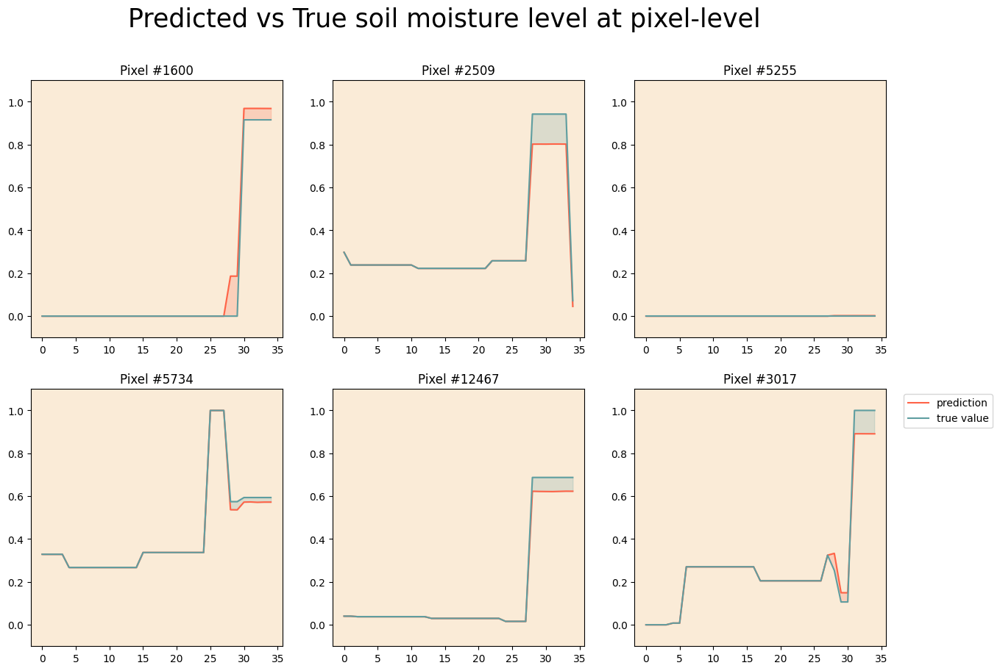

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

plt.suptitle('Predicted vs True soil moisture level at pixel-level', fontsize = '25')


# Loop through each subplot and plot a random column
for i in range(2):
    for j in range(3):
        rc = np.random.choice([i for i in range(len(sm_pred))])
        axs[i][j].set_facecolor('antiquewhite')
        
        true_values = np.concatenate((previous_days[rc],sm_true[rc]))
        pred_values = np.concatenate((previous_days[rc],sm_pred[rc]))
        
        axs[i][j].plot(pred_values, label = 'prediction',color= 'tomato')
        axs[i][j].plot(true_values, label = 'true value',color = 'cadetblue')
        axs[i][j].fill_between([i for i in range(35)],pred_values,true_values,where = pred_values >= true_values,alpha=.2,color='tomato')
        axs[i][j].fill_between([i for i in range(35)],pred_values,true_values,where = pred_values <= true_values,alpha=.2,color='cadetblue')
        axs[i][j].set_title(f'Pixel #{rc}')
        axs[i][j].set_ylim(-.1,1.1)
        if i == 1 and j == 2:
            axs[i][j].legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')


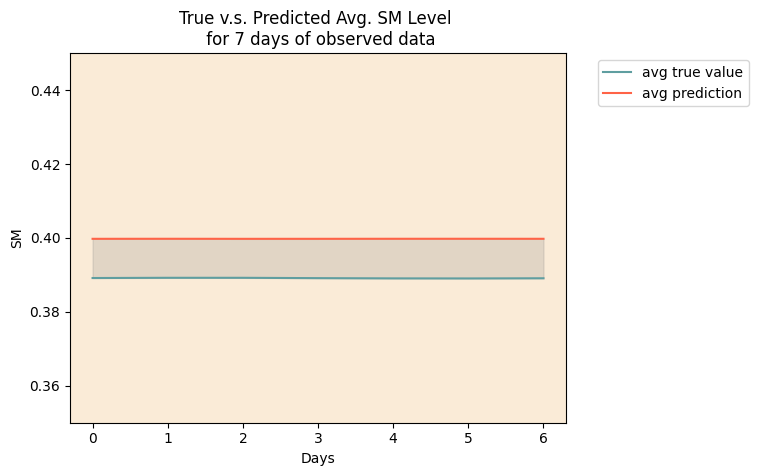

In [ ]:
# previous 28 days
# col_avg_past = np.mean(previous_days,axis=0)

col_avg_true = np.mean(sm_true, axis=0)
col_avg_pred = np.mean(sm_pred, axis=0)

# total_avg_true = np.concatenate((col_avg_past,col_avg_true))
# total_avg_pred = np.concatenate((col_avg_past,col_avg_pred))

# col_max_true = np.max(sm_true, axis=0)
# col_max_pred = np.max(sm_pred, axis=0)

# col_min_true = np.min(sm_true, axis=0)
# col_min_pred = np.min(sm_pred, axis=0)

fig, ax = plt.subplots()
ax.set_facecolor('antiquewhite')
ax.plot(col_avg_true, label = 'avg true value',color = 'cadetblue')
ax.plot(col_avg_pred, label = 'avg prediction',color = 'tomato')
# plt.plot(col_max_true, label = 'max true value')
# plt.plot(col_max_pred, label = 'max prediction',color='tomato')
# plt.plot(col_min_true, label = 'mimum true value')
# plt.plot(col_min_pred, label = 'minimum prediction',color='tomato')
ax.fill_between([0,1,2,3,4,5,6],col_avg_pred,col_avg_true,alpha=.2,color = 'gray')

plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.xlabel('Days')
plt.ylabel('SM')
plt.ylim(.35,.45)
plt.title("True v.s. Predicted Avg. SM Level \n for 7 days of observed data");


For this particular sequence, we found that true soil moisture averaged at 0.4 throughout the week. Our mode, on average, slighly overpredicted by 0.01, demonstrating good performance. Our results also capture the trend of the true values, which is constant for this particular 7 day sequence.

#### Inference on unseen data

We wanted to leverage our model to predict on unseen data with no currently observable true values. We sit in anticipiation for the true soil moisture values to reveal themselves :)

In [ ]:
# last days of our data
last_geo_files = {key: value[-x_window:] for key,value in final_geo_files.items()}

In [ ]:
len(last_geo_files["sm"])

28

In [ ]:
WINDOW_SIZE = x_window # Number of days to use for each prediction, X,y
STEP_SIZE = 1  # Number of days between each prediction
new_height = 80
new_width = 160

features = ["sm", "temp", "evap", "precip"]
last_window_inputs = []

arrays = [
    last_geo_files[name][0 :x_window, :new_height, :new_width] for name in features
]
inputs = torch.from_numpy(np.stack(arrays, axis=1))
last_window_inputs.append(inputs)

In [ ]:
# Set model to evaluation mode
model.eval()
predictions = model(last_window_inputs[0])

<ipython-input-46-94e096f23651>:4: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  first_batch = np.array(next(test_dataloader_iter))
<ipython-input-46-94e096f23651>:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  first_batch = np.array(next(test_dataloader_iter))


In [ ]:
sm_future = predictions.detach().numpy()[0]
sm_future = sm_future.reshape(80*160,7)
sm_past = last_window_inputs[0].detach().numpy()
sm_past = sm_past.reshape(4,28,80,160)
sm_past = sm_past[0]
sm_past = sm_past.reshape(80*160,28)

sm_join = result = np.concatenate((sm_past, sm_future), axis=1)
sm_join_df = pd.DataFrame(sm_join).T

In [ ]:
start_date = '2023-04-09'  # specify your desired start date here
end_date = '2023-05-13'    # specify your desired end date here

# Generate a range of dates between the start and end dates (inclusive)
date_range = pd.date_range(start=pd.Timestamp(start_date), end=pd.Timestamp(end_date), freq='D')

# Convert the pandas DatetimeIndex object to a Python list
date_list = date_range.tolist()

#join index 
sm_join_df.index = date_list 


In [ ]:
# Define function to get columns with all zeros or very small values before a certain date
def get_zero_cols(df, date):
    all_zeros_cols = ((df.loc[:date] == 0) | (df.loc[:date] < 1e-6)).all()
    zero_cols = all_zeros_cols[all_zeros_cols].index.tolist()
    return zero_cols

# Find columns with all zeros before '2023-05-07'
all_zeros_cols = ((sm_join_df.loc[:'2023-05-05'] == 0) | (sm_join_df.loc[:'2023-05-06'] < 0.001)).all()
cols_to_drop = all_zeros_cols[all_zeros_cols].index

# Drop the columns
sm_join_df.drop(columns=cols_to_drop, inplace=True)


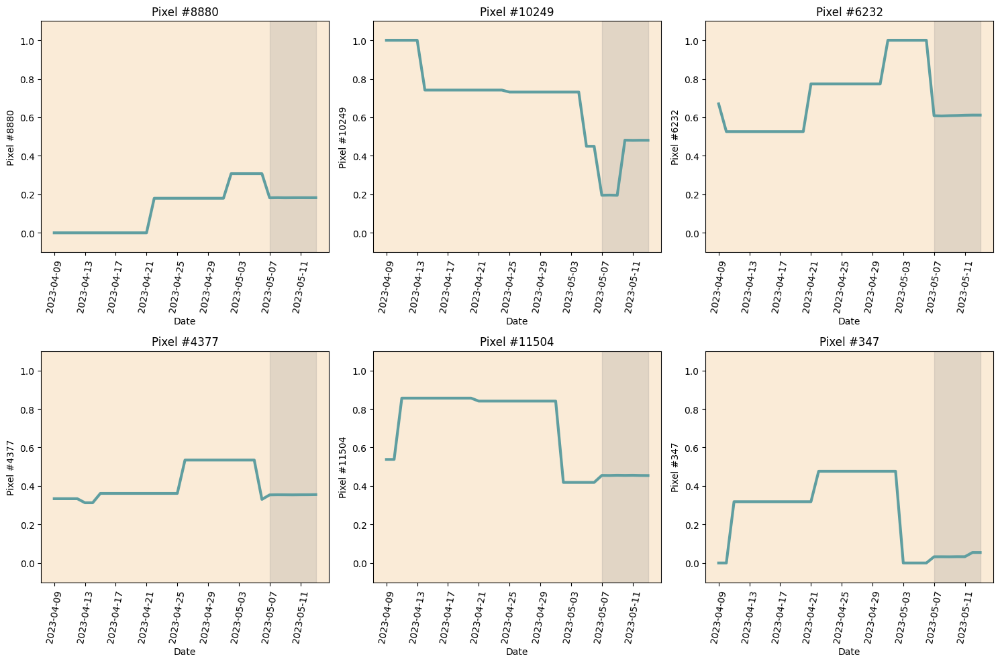

In [ ]:
# Create a figure with 5 rows and 5 columns
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Loop through each subplot and plot a random column
for i in range(2):
    for j in range(3):
        random_col = np.random.choice(sm_join_df.columns)
        axs[i][j].set_facecolor('antiquewhite')
        axs[i][j].plot(sm_join_df.index, sm_join_df[random_col], label=random_col,color="cadetblue",lw=3)

        # Shade the area after index '2023-05-07'
        axs[i][j].axvspan(xmin=pd.Timestamp('2023-05-07'), xmax=sm_join_df.index[-1], color='gray', alpha=0.2)

        # Set plot title and axis labels
        axs[i][j].set_title(f'Pixel #{random_col}')
        axs[i][j].set_xlabel('Date')
        axs[i][j].set_ylabel(f'Pixel #{random_col}')
        axs[i][j].set_xticks(sm_join_df.index[::4])
        axs[i][j].set_xticklabels([date.strftime('%Y-%m-%d') for date in sm_join_df.index[::4]], rotation=80)

        # Set y axis limits from 0 to 1
        axs[i][j].set_ylim([-0.1, 1.1])

# Set the layout tight
fig.tight_layout()

# Save the plot as a PNG image
plt.savefig('/content/drive/Shareddrives/AC 209b - Project/small_multiples.png')


## BVit: Baysian Vision Transformers

We consider our ViT model to be our final model. However, we attempted to improve upon it. 

Vision Transformers generate point estimates without assessing the uncertainty of predictions. We wanted to explore estimating prediction intervals and quantifying model uncertainty as we believe this would be crucial for informed decision-making. Furthermore, traditional ViTs cannot incorporate prior knowledge or expert insights about variable distributions while the bayesian framework allows us to do that. 

To begin with, we used gaussian non-informative priors on the weights and biases of our ViT. Bayesian Vision Transformers provide full posterior distributions for outputs, allowing for uncertainty quantification.

### Model Architecture

In [ ]:
# Prior: N(0,1)
# Define the training parameters
batch_size = 1
learning_rate = 1e-3
num_epochs = 10
num_timesteps = batch_size*28

height = window_inputs[0].shape[-2]
width = window_inputs[0].shape[-1]
in_channels = window_inputs[0].shape[-3]
print(height, width, in_channels)


import torch
import torch.nn as nn
import pyro
from pyro.nn import PyroModule, PyroSample
from pyro.distributions import Normal



class BayesianVisualTransformer(PyroModule, nn.Module):
    def __init__(
        self,
        image_width=width,
        image_height=height,
        patch_size=20,
        hidden_size=256,
        num_layers=2,
        num_heads=8,
        dropout=0.1,
        num_timesteps=num_timesteps,
    ):
        PyroModule.__init__(self)  # BAYESIAN: Initialize PyroModule
        nn.Module.__init__(self)
        self.patch_size = patch_size
        self.image_width = image_width
        self.image_height = image_height
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.num_heads = num_heads
        self.dropout = dropout
        self.num_timesteps = num_timesteps

        self.num_patches_width = image_width // patch_size
        self.num_patches_height = image_height // patch_size
        self.num_patches = self.num_patches_width * self.num_patches_height

        # BAYESIAN: Wrap the Conv2d layer with PyroModule and define the prior distributions for its parameters
        self.patch_embed = PyroModule[nn.Conv2d](
            in_channels=in_channels,
            out_channels=hidden_size,
            kernel_size=self.patch_size,
            stride=self.patch_size,
        )
        self.patch_embed.weight = PyroSample(
            Normal(0.0, 1.0)
            .expand([hidden_size, in_channels, self.patch_size, self.patch_size])
            .to_event(4)
        )
        self.patch_embed.bias = PyroSample(
            Normal(0.0, 1.0).expand([hidden_size]).to_event(1)
        )

        self.pos_embed = nn.Parameter(
            torch.randn(self.num_timesteps, self.num_patches, hidden_size)
        )

        # BAYESIAN: Wrap the TransformerEncoderLayer with PyroModule
        self.transformer_layers = nn.ModuleList(
            [
                PyroModule[nn.TransformerEncoderLayer](
                    d_model=hidden_size, nhead=num_heads, dropout=dropout
                )
                for _ in range(num_layers)
            ]
        )


        
        # BAYESIAN: Wrap the Linear layer with PyroModule and define the prior distributions for its parameters
        self.classifier = nn.Sequential(
            PyroModule[nn.Linear](
                self.hidden_size,
                batch_size * y_window * self.image_width * self.image_height,
            ),
            nn.Sigmoid()
        )
        self.classifier[0].weight = PyroSample(
            Normal(0.0, 1.0)
            .expand(
                [
                    batch_size * y_window * self.image_width * self.image_height,
                    self.hidden_size,
                ]
            )
            .to_event(2)
        )
        self.classifier[0].bias = PyroSample(
            Normal(0.0, 1.0)
            .expand([batch_size * y_window * self.image_width * self.image_height])
            .to_event(1)
        )


    def forward(self, x):
        x = x.view(x.shape[0], x.shape[2], x.shape[1], x.shape[3])

        x = self.patch_embed(x)

        b, c, h, w = x.shape
        x = x.view(b, c, -1).transpose(1, 2)

        x = x + self.pos_embed

        for layer in self.transformer_layers:
            x = layer(x)

        x = x.mean(dim=1)

        # Apply the final classification layer and return the output
        x = self.classifier(x)
        x = x.mean(dim=0)
        x = x.view(batch_size, y_window, self.image_height, self.image_width)
        return x


80 160 4


Model Diagram From Tensorboard

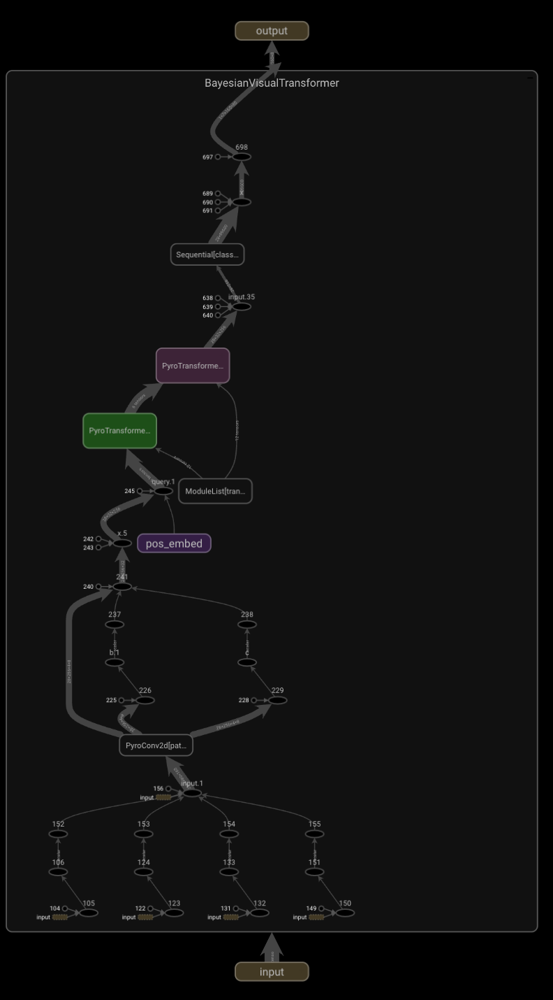

### Model Training and Validation

In [ ]:
# Initialize the model and optimizer
model = BayesianVisualTransformer().to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Define the loss functions
mse_loss = nn.MSELoss()
mape_loss = nn.L1Loss()

In [ ]:
# Initialize variables for early stopping
best_loss = float('inf')
best_epoch = 0
patience = 5
count = 0

In [ ]:
from tqdm import tqdm

# Train the model on the training set
for epoch in range(num_epochs):
    running_loss = 0.0
    running_mape = 0.0
    progress_bar = tqdm(train_dataloader, desc=f'Epoch {epoch+1}/{num_epochs}')
    for i, (inputs, mask) in enumerate(progress_bar):
        # Move the inputs and mask to the GPU if available
        inputs = inputs.to(device)
        mask = mask.to(device)
        # Apply the mask to the inputs to handle NaN values
        inputs = torch.where(mask == 0, torch.zeros_like(inputs), inputs)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)

        # Compute the loss
        mse = mse_loss(outputs, train_batched_output_sequence[i])
        mape = mape_loss(outputs, train_batched_output_sequence[i])
        loss = mse

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        running_mape += mape.item() * inputs.size(0)

        # Update the progress bar
        progress_bar.set_postfix({'train_loss': loss.item(), 'train_mape': mape.item()})

    epoch_loss = running_loss / len(train_dataloader.dataset)
    epoch_mape = running_mape / len(train_dataloader.dataset)

    # Evaluate the model on the validation set
    with torch.no_grad():
        val_loss = 0.0
        val_mape = 0.0
        for i, (inputs, mask) in enumerate(val_dataloader):
            # Move the inputs and mask to the GPU if available
            inputs = inputs.to(device)
            mask = mask.to(device)
            # Apply the mask to the inputs to handle NaN values
            inputs = torch.where(mask == 0, torch.zeros_like(inputs), inputs)

            # Forward pass
            outputs = model(inputs)

            # Compute the loss
            mse = mse_loss(outputs, val_batched_output_sequence[i])
            mape = mape_loss(outputs, val_batched_output_sequence[i])
            loss = mse

            val_loss += loss.item() * inputs.size(0)
            val_mape += mape.item() * inputs.size(0)

        val_loss /= len(val_dataloader.dataset)
        val_mape /= len(val_dataloader.dataset)

    print('Epoch [{}/{}], Train Loss: {:.4f}, Train MAPE: {:.4f}, Val Loss: {:.4f}, Val MAPE: {:.4f}'
          .format(epoch+1, num_epochs, epoch_loss, epoch_mape, val_loss, val_mape))

    # Check for early stopping
    if val_loss < best_loss:
        best_loss = val_loss
        best_epoch = epoch
        count = 0
        # Save the model weights
        torch.save(model.state_dict(), 'VIT_v8_bayesian_vit.pth')
    else:
        count += 1
        if count == patience:
            print(f'Validation loss did not improve for {patience} epochs. Training stopped.')
            break

Epoch 1/10: 100%|██████████| 2331/2331 [14:45<00:00,  2.63it/s, train_loss=0.562, train_mape=0.372]


Epoch [1/10], Train Loss: 0.6004, Train MAPE: 0.3856, Val Loss: 0.5495, Val MAPE: 0.3653


Epoch 2/10: 100%|██████████| 2331/2331 [14:39<00:00,  2.65it/s, train_loss=0.52, train_mape=0.357] 


Epoch [2/10], Train Loss: 0.5326, Train MAPE: 0.3595, Val Loss: 0.5064, Val MAPE: 0.3489


Epoch 3/10: 100%|██████████| 2331/2331 [14:39<00:00,  2.65it/s, train_loss=0.515, train_mape=0.355]


Epoch [3/10], Train Loss: 0.5071, Train MAPE: 0.3500, Val Loss: 0.5023, Val MAPE: 0.3473


Epoch 4/10: 100%|██████████| 2331/2331 [14:41<00:00,  2.64it/s, train_loss=0.513, train_mape=0.355]


Epoch [4/10], Train Loss: 0.5041, Train MAPE: 0.3489, Val Loss: 0.4997, Val MAPE: 0.3464


Epoch 5/10: 100%|██████████| 2331/2331 [14:41<00:00,  2.65it/s, train_loss=0.513, train_mape=0.355]


Epoch [5/10], Train Loss: 0.5028, Train MAPE: 0.3484, Val Loss: 0.4984, Val MAPE: 0.3459


Epoch 6/10: 100%|██████████| 2331/2331 [14:41<00:00,  2.65it/s, train_loss=0.512, train_mape=0.354]


Epoch [6/10], Train Loss: 0.5020, Train MAPE: 0.3481, Val Loss: 0.4986, Val MAPE: 0.3460


Epoch 7/10: 100%|██████████| 2331/2331 [14:43<00:00,  2.64it/s, train_loss=0.512, train_mape=0.354]


Epoch [7/10], Train Loss: 0.5014, Train MAPE: 0.3479, Val Loss: 0.4977, Val MAPE: 0.3456


Epoch 8/10: 100%|██████████| 2331/2331 [14:44<00:00,  2.64it/s, train_loss=0.512, train_mape=0.354]


Epoch [8/10], Train Loss: 0.5010, Train MAPE: 0.3478, Val Loss: 0.4977, Val MAPE: 0.3456


Epoch 9/10: 100%|██████████| 2331/2331 [14:35<00:00,  2.66it/s, train_loss=0.512, train_mape=0.354]


Epoch [9/10], Train Loss: 0.5007, Train MAPE: 0.3477, Val Loss: 0.4974, Val MAPE: 0.3455


Epoch 10/10: 100%|██████████| 2331/2331 [14:31<00:00,  2.68it/s, train_loss=0.514, train_mape=0.355]


Epoch [10/10], Train Loss: 0.5005, Train MAPE: 0.3476, Val Loss: 0.4971, Val MAPE: 0.3454


Here, with the Bayesian ViT, the validation MSE and MAPE are higher than what we obtained with our ViT. Again, the implementation of this model was a first attempt to pave the way for future work. The poor results might be the consequence of some typos in the implementation code or indicate that we should refine the choice of our priors.

In [ ]:
# Save the model weights to a file
torch.save(model.state_dict(), 'VIT_v8_bayesian_vit.pth')

# Set up the GCP storage client
client = storage.Client()

# Get the GCP bucket
bucket = client.get_bucket('smap-satellite-images-reduced')

# Define the destination file name in the bucket
destination_blob_name = 'model_weights/VIT_v8_bayesian_vit.pth'

# Upload the file to the GCP bucket
blob = bucket.blob(destination_blob_name)
blob.upload_from_filename('VIT_v8_bayesian_vit.pth')

### Testing

In [ ]:
# Load weights for Bayesian ViT
bayesian_vit = BayesianVisualTransformer()

weights_file = "model_weights/VIT_v8_bayesian_vit.pth"

blob = bucket.blob(weights_file)
data = blob.download_as_string()

# Load the weights into the model
state_dict = torch.load(io.BytesIO(data))
bayesian_vit.load_state_dict(state_dict)

<All keys matched successfully>

In [ ]:
# Test VIT
bayesian_vit.eval()  # Set the model to evaluation mode
mse_loss = nn.MSELoss(reduction="mean")
mape_loss = nn.L1Loss(reduction="mean")
total_mse_loss = 0
total_mape_loss = 0

with torch.no_grad(), tqdm(total=len(test_dataloader), desc="Testing") as pbar:
    for i, ((data, mask), true_values) in enumerate(
        zip(test_dataloader, window_outputs)
    ):
        data = data.to(device)
        mask = mask.to(device)
        output = bayesian_vit(data)
        loss_mse = mse_loss(output, true_values)
        loss_mape = mape_loss(output, true_values)
        total_mse_loss += loss_mse.item()
        total_mape_loss += loss_mape.item()
        pbar.update(1)

# Calculate and print the average loss over the test set
avg_mse_loss = total_mse_loss / len(window_outputs)
avg_mape_loss = total_mape_loss / len(window_outputs)
print("Average MSE loss on test set: ", avg_mse_loss)
print("Average MAPE loss on test set: ", avg_mape_loss)

Testing: 100%|██████████| 292/292 [01:33<00:00,  3.11it/s]

Average MSE loss on test set:  0.03815450870630752
Average MAPE loss on test set:  0.049275689374197816


Again, we see poor results on the test set compared to our previous ViT model for the same potential reasons mentioned above.

# DISCUSSION 

## Model Strengths 

ConvLSTM2D models and Vision Transformers have different strengths and are suitable for different types of data and tasks. We enjoyed learning about these methods and we were happy too see their success in performing our problem statement. 

ConvLSTM2D models have a strong ability to capture spatiotemporal patterns in sequential data, such as time series or video data. They are particularly useful for tasks that require understanding the dynamics of how patterns evolve over time and space, such as weather forecasting, traffic prediction, and action recognition in videos. The combination of convolutional and LSTM layers allows the model to extract spatial features and temporal dependencies from the data, respectively. The model can also learn to predict the future based on the past, making it useful for forecasting tasks.

On the other hand, Vision Transformers are particularly effective for processing image data. They can handle large images with high resolution, making them suitable for tasks such as object recognition, image classification, and image segmentation. They can learn global spatial relationships and capture long-range dependencies in images, allowing them to recognize complex patterns and objects in images. They are also more computationally efficient than traditional convolutional neural networks, making them useful for large-scale image processing tasks.

## Study Limitations

An important lesson we have learned is the necessity of aligning the data type with the intended model to be used. It's crucial to understand which file formats are compatible with specific models. Therefore, it's essential to ensure that our data is in the appropriate format before using it for modeling purposes. This can save significant time and effort in the long run.

Another important lesson that we have learned is the challenge of managing data storage and memory usage. Our project involved processing large amounts of data, which often resulted in running out of available memory and crashing our Colabs or Jupyter notebooks. This issue required us to optimize our code and find ways to manage memory more efficiently, such as using generators to load data in batches and freeing memory as soon as it is no longer needed. We also had to consider alternative storage options such as local, cloud storage, and distributed computing to handle larger datasets.

Luckily, we found a Mac Pro within the IQSS computer lab that is available for research projects. We were able to utilize this to pull in our entire data set and perform all of our modeling on. 


## Future Work and Improvements

### Improving BViT

Based on the results, the BViT has higher average MSE and MAPE loss on the test set compared to the regular Vision Transformer. The implementation of this model was a first attempt to pave the way for future work. The poor results might be the consequence of some typos in the implementation code or indicate that we should refine the choice of our priors.

To improve the BViT, the next steps would be to review the code to get rid of any typo and try different priors. If the model is still not better than our Vision Transformer, we could try hierarchical priors to adapt our priors to potential subgroups of patches in our data. We could also explore empirical bayesian to give our model a starting advantage from the relationships captured in underlying data.

### Predicting Soil Moisture in intervals

Predicting soil moisture in intervals, as opposed to only point estimates, provides a range of possible outcomes, along with a measure of uncertainty. This range of outcomes can be more informative and useful for decision-making in scenarios where the uncertainty of the prediction is important. In our case, where decisions about irrigation and water usage are affected by factors such as drought, climate change, or weather patterns.

By providing a range of possible outcomes, rather than just a single point estimate, decision-makers can better understand the risk associated with their decisions and take a more informed approach to managing water resources. This can help prevent overuse or waste of water resources, and ultimately lead to more efficient and effective management of water resources.

## Ackowledgments

We would like to thank those that have helped us successfully complete our project. 
<br><br>
For those in Harvard's Earth and Planetary Science department:<br>
Eli Tziperman Ph.D. Professor of Oceanography and Applied Physics<br>
Jon Proctor Ph.D. Earth and Planetary Science Post Doc<br>
Lucas Zeppetello Ph.D. Earth and Planetary Science Post Doc<br>
<br><br>
Chris Gumb, AC 209b Preceptor<br>
Robi Rahman, AC 209b Project TF<br>
Pavlos Protopapas, Ph.D. Scientific Program Director, Institute for Applied Computational Science
<br><br>
Institute for Quantitative Social Science Computer Lab, and of course, the **Mac Pro** at station: IQSS-024-M04. 
With specs of: 
- Processor - 2.5 GHz 28-Core Intel Xeon 
- Memory - 192GB 1866 MHz DDR3 ECC
- Graphics - AMD Radeon Pro Vega II Duo 32 GB
- Display - 32 inch Apple Pro Display XDR

**Thank you!**<br>
**-Team 15**

# APPENDIX

The appendix contains deprecated code that we did not end up using for our final analysis but may find useful for future work. 

## Generators

- For the milestone 4, we used our model on the entire data we pulled from the Cloud that we were able to load locally. Using the TimeseriesGenerator was a great way to put the data into the desired shape (sequences of given length). However, we would like to create our own generator. This generator should be able to load only the necessary amount of data directly from our Google Cloud Bucket and put the data into the desired shape during the model training process.  

- We worked on the following generator (see next code cells). So far, our generator can handle any sequence length for both x and y, but is computationally expensive when we try to fit the model on it (resources exhausted error message). This was a first try, but we do believe that we will be able to improve our generator and do some operations more efficiently. We could explore the following:

  - currently, the preprocessing is done within our generator (nan, scaling, shape), however, we could push the preprocessed data into a bucket and load directly from there (depends on our resources and if we can create one more bucket)
  - also, we believe that our generator is loading a bit more data than necessary and that we can simplify some operations to make it less computationally expensive 
  - we could also reduce the size of the images to gain memory space

__*The code below defines a function called `make_mask()` that generates a mask layer. The function first lists the files in a Google Cloud Platform (GCP) bucket and then downloads the GeoTIFF files that match a certain pattern, storing them in a dictionary. It then sets up a counter variable, downloads the first file of each type with a progress bar, and reads the pixel values for the first band of each file as a NumPy array. It replaces NoData values with NaN and appends the resulting tuple containing the data and file name to a list within the dictionary. It then creates a mask by copying the first GeoTIFF file, setting all non-NaN values to 0, and all NaN values to 1. Finally, it saves the mask and returns the mask image as a NumPy array. The purpose of this function is to create a binary mask for later use in a project, for masking out the ocean regions in the data in an efficient way.*__

In [ ]:
def make_mask():
  
  """ 
  Helper function to generate the mask layer and save it.
  We already have one but keeping this function incase it gets deleted and need
  to create new one 
  
  """

  #List the files in the GCP bucket
  blobs = list(bucket.list_blobs())
  #Download the GeoTIFF files and store them in the dictionary
  file_patterns = {
      'sm': re.compile(r'^smSurface_\d{4}-\d{2}-\d{2}\.tif$'),
  }

    geo_files = {key: [] for key in file_patterns}
    # Group blobs by file type
    blobs_by_type = {key: [] for key in file_patterns}
    for blob in blobs:
        file_name = blob.name
        for key, pattern in file_patterns.items():
            if pattern.match(file_name):
                blobs_by_type[key].append(blob)
  # Set counter variable
  counter = {key: 0 for key in file_patterns}
  # Download files with progress bars
  for key, blob_list in blobs_by_type.items():
        print(f'Downloading {key} files:')
        for blob in tqdm(blob_list[0:1]):
          # this if-break statement is to only download certain amount of data
          if counter[key] >= 1:
                break
          # Read the GeoTIFF file into memory and open it using rasterio
          with MemoryFile(blob.download_as_bytes()) as memfile:
                with memfile.open() as dataset:
                  # Read the pixel values for the first band as a NumPy array
                  data = dataset.read(1)
                  # Replace NoData values with NaN
                  nodata_value = dataset.nodata
                    if nodata_value is not None:
                        data[data == nodata_value] = np.nan
                        geo_files[key].append((data, blob.name)) # Append tuple containing data and file name
                        counter[key] += 1
    # Make Mask
    mask_image = geo_files['sm'][0][0].copy()
    mask_image[~np.isnan(mask_image)] = 0
    mask_image[np.isnan(mask_image)] = 1
    np.savetxt(r'/content/drive/Shareddrives/AC 209b - Project/Milestone/MS4/mask.csv', mask_image, delimiter=',')
    return mask_image

In [ ]:
# Load mask:
mask_path = '/content/drive/Shareddrives/AC 209b - Project/Milestone/MS4/mask.csv'
mask =  np.loadtxt(mask_path, delimiter=',')

__*The code below defines a function called `data_generator` that takes in five parameters: `start_date`, `end_date`, `x_window_size`, `y_window_size`, and `batch_size`.*__

__*The function first calculates the total number of days between start_date and end_date and then uses this to compute the number of sequences and batches to create.*__

__*Within each batch, the function retrieves TIFF files from Google Cloud Storage (GCS) containing data for specific dates, preprocesses the data (scales, replaces NaN values with zero), and then concatenates and reshapes the data into two arrays: `X_temp` and `Y_temp`. These arrays hold the input and output data for the neural network model that will be trained using this data.*__

__*After processing all the data for the current batch, the function creates two arrays for the entire batch: `X` and `Y`. These arrays hold the input and output data for the neural network model that will be trained using this data. The `X` array is created by stacking arrays of data from the `X_temp` array, while the `Y` array is created by stacking arrays of data from the `Y_temp` array.*__

__*Finally, the function yields each batch of `X` and `Y` arrays, so that they can be fed into the neural network for training.*__

In [ ]:
#connect to bucket
storage_client = storage.Client.from_service_account_json(key_file_path)
bucket = storage_client.get_bucket(bucket_name)

def data_generator(start_date, end_date, x_window_size=28, y_window_size=7, batch_size=2):
  # Compute the total number of days between start_date and end_date
  total_days = (end_date - start_date).days + 1
  # Calculate the number of sequences
  num_sequences = total_days - x_window_size - y_window_size + 1
  # Calculate the number of batches
  num_batches = round(num_sequences/batch_size)
  # Loop over the batches: use a generator to stop after each batch of data is loaded
  for batch_idx in range(num_batches):
      # Calculate the start and end dates for the current batch
        batch_start_date = start_date + timedelta(days=batch_idx)
        batch_end_date = batch_start_date + timedelta(days=x_window_size + y_window_size)
      
        # Master arrays/dic to yield at the end
        geo_files = {}
        X_temp = np.empty((0,94,166,4))
        Y_temp = np.empty((0,94,166))
        # Load images for the current batch from GCS, transform and append to images
        print('Generating Batch')
        for single_date in (batch_start_date + timedelta(n) for n in tqdm(range((batch_end_date - batch_start_date).days + 1))):
        #Get Date of the file
        date_file = single_date.strftime('%Y-%m-%d')
        # Download the necessary files
        file_prefixes = ['smSurface', 'precipitation', 'surface_temp', 'evapotranspiration']
        for prefix in file_prefixes:
            file_name = f'{prefix}_{date_file}.tif'
            blob = bucket.blob(file_name)

            # Load the TIFF file directly into memory without storing it locally
            url = f"https://storage.googleapis.com/{bucket_name}/{file_name}"
            blob = bucket.blob(file_name)
            content = blob.download_as_bytes()
            geo_files[prefix] = imread(io.BytesIO(content))
            # add mask layer to geofile
            geo_files['mask'] = mask
        max_sm = np.nanmax(geo_files['smSurface'])
        geo_files['smSurface'] = np.nan_to_num(geo_files['smSurface'], nan=max_sm)
        for key in list(geo_files.keys())[1:]:
            min_key = np.nanmin(geo_files[key])
            geo_files[key] = np.nan_to_num(geo_files[key], nan=min_key)

        # Preprocess the data (MinMaxScaler, replace NaN values, etc.)
        # Initialize the MinMaxScaler
        scaler = MinMaxScaler()
        # Loop through the keys in the geo_files dictionary
        for key in geo_files:
          #exclude mask
          if key != 'mask':
              # Get the current array of images
              images = geo_files[key]
              # Get the shape of the images array
              original_shape = images.shape
              # Reshape the images array to 2D for applying the scaler
              images_2d = images.reshape(-1, original_shape[-1])
              # Fit the scaler on the 2D images array and transform it
              scaled_images_2d = scaler.fit_transform(images_2d)
              # Reshape the scaled images back to their original shape
              scaled_images = scaled_images_2d.reshape(original_shape)
              # Update the images in the geo_files dictionary
              geo_files[key] = scaled_images
        # Take all values in the dictionary for all keys, and replace nan with zero and keep scaled values the same
        for key, value in geo_files.items():
            geo_files[key] = np.where(np.isnan(value), 0, value)
        # Concatenate, split, and reshape the data
        x = np.stack([np.stack(arrays, axis=0) for key, arrays in geo_files.items() if key != 'smSurface'], axis=-1)
        y = np.stack(geo_files['smSurface'], axis=0)
        #reshape to fit X_temp, Y_temp
        x = x.reshape(1,*x.shape[:])
        y = y.reshape(1,*y.shape[:])
        # concat x and y to master
        X_temp = np.concatenate((X_temp, x),axis=0)
        Y_temp = np.concatenate((Y_temp, y),axis=0)
        # Master arrays for batches
        X = np.array([X_temp[i:i+x_window_size, :, :, :] for i in range(batch_size)])
        #Y = np.array([Y_temp[i+x_window_size] for i in range(batch_size)])
        Y = np.array([Y_temp[i+x_window_size:i+x_window_size+y_window_size, :, :] for i in range(batch_size)])
        # Yield the batches of images

        # for (x,y) in zip(X,Y):
        #   x[np.isinf(x)] = np.nan
        #   y[np.isinf(y)] = np.nan

        yield X, Y

In [ ]:
 # test the generator 
start_date = datetime(year=2018, month=4, day=1)
end_date = datetime(year=2018, month=4, day=9)
batch_size = 2
x_window_size = 7
y_window_size = 1
# initialize generator:
train_gen = data_generator(start_date, end_date, x_window_size=x_window_size, y_window_size=y_window_size, batch_size=batch_size)
# Generate data untill stopage:
i=0
while i <1:
try:
    x_batch,y_batch = next(train_gen)
    print(f'batch: {i+1}, x_shape: {x_batch.shape} , y_shape{y_batch.shape}')
    i+=1
except StopIteration:
    pass